In [1]:
pip install pyspellchecker

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install pdfplumber

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install PyPDF2 nltk spellchecker

Note: you may need to restart the kernel to use updated packages.


In [19]:
import re
import pdfplumber
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Download required NLTK data
nltk.download('punkt')
nltk.download('stopwords')

# Define the path for your PDF file and output file
pdf_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Anne-Frank-The-Diary-Of-A-Young-Girl.pdf'
Data_Preprocessing = 'Data Preprocessing.txt'

# Function to preprocess text
def preprocess_text(text):
    # Normalize text
    text = text.lower()
    text = re.sub(r'(?<!\w)([A-Za-z])\s+', r'\1', text)
    text = re.sub(r'\s+', ' ', text)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\w\s]', '', text)

    # Tokenize text without stemming
    tokens = word_tokenize(text)

    # Remove stop words
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens if word not in stop_words]

    return ' '.join(filtered_tokens)

# Read the PDF file using pdfplumber
def extract_text_from_pdf(pdf_path):
    text_content = []
    with pdfplumber.open(pdf_path) as pdf:
        for page in pdf.pages:
            text_content.append(page.extract_text())

    return ' '.join(text_content).replace('\n', ' ')

# Extract text from PDF
pdf_text = extract_text_from_pdf(pdf_file_path)

# Preprocess text
preprocessed_text = preprocess_text(pdf_text)

# Write the preprocessed text to a new file
with open(Data_Preprocessing, 'w', encoding='utf-8') as output_file:
    output_file.write(preprocessed_text)

print("Preprocessing complete. Output saved to", Data_Preprocessing)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Preprocessing complete. Output saved to Data Preprocessing.txt


In [7]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')

input_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Data Preprocessing.txt'

with open(input_file_path, 'r', encoding='utf-8') as file:
    preprocessed_text = file.read()

sentences = nltk.sent_tokenize(preprocessed_text)

sid = SentimentIntensityAnalyzer()

# Now, let's redefine our sentiment labels more generally:
positive_label = "Positive"
negative_label = "Negative"
neutral_label = "Neutral"

# Function to label sentiment
def label_sentiment(sentence):
    sentiment_score = sid.polarity_scores(sentence)
    compound_score = sentiment_score['compound']

    if compound_score >= 0.2:
        return positive_label
    elif compound_score <= -0.2:
        return negative_label
    else:
        return neutral_label

# Apply sentiment labeling to each sentence
sentiment_labels = [label_sentiment(sentence) for sentence in sentences]

# Count the occurrences of each label
label_counts = {label: sentiment_labels.count(label) for label in set(sentiment_labels)}

# Display the counts for each sentiment label
print("Sentiment Labels and Counts:")
for label, count in label_counts.items():
    print(f"{label}: {count}")

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...


Sentiment Labels and Counts:
Optimistic: 1
Aspirational: 1
Love: 1
Curious: 1
Affectionate: 1
Gratitude: 1
Hopeful: 1
Joy: 1


In [8]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')

input_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Data Preprocessing.txt'

with open(input_file_path, 'r', encoding='utf-8') as file:
    preprocessed_text = file.read()

sentences = nltk.sent_tokenize(preprocessed_text)

sid = SentimentIntensityAnalyzer()

# Now, let's redefine our sentiment labels more generally:
positive_label = "Positive"
negative_label = "Negative"
neutral_label = "Neutral"

# Function to label sentiment
def label_sentiment(sentence):
    sentiment_score = sid.polarity_scores(sentence)
    compound_score = sentiment_score['compound']

    if compound_score >= 0.2:
        return positive_label
    elif compound_score <= -0.2:
        return negative_label
    else:
        return neutral_label

# Apply sentiment labeling to each sentence
sentiment_labels = [label_sentiment(sentence) for sentence in sentences]

# Count the occurrences of each label
label_counts = {label: sentiment_labels.count(label) for label in set(sentiment_labels)}

# Display the counts for each sentiment label
print("Sentiment Labels and Counts:")
for label, count in label_counts.items():
    print(f"{label}: {count}")

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Sentiment Labels and Counts:
Positive: 1


In [9]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')
nltk.download('punkt')

input_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Data Preprocessing.txt'

with open(input_file_path, 'r', encoding='utf-8') as file:
    text = file.read()

sentences = nltk.sent_tokenize(text)
sid = SentimentIntensityAnalyzer()

# Define a function to determine the custom sentiment label
def custom_label(sentence):
    score = sid.polarity_scores(sentence)
    words = nltk.word_tokenize(sentence.lower())

    # Example of custom logic based on keywords and baseline sentiment:
    # This is a simplified version. You might need more complex rules.
    if score['compound'] > 0.2:
        if any(word in words for word in ['hope', 'dream']):
            return 'Hopeful'
        elif any(word in words for word in ['curious']):
            return 'Curious'
        # Add rules for other positive sentiments as needed.
    elif score['compound'] < -0.2:
        if any(word in words for word in ['fear', 'threat']):
            return 'Fearful'
        elif any(word in words for word in ['frustrated', 'confined']):
            return 'Frustrated'
        # Add rules for other negative sentiments as needed.
    else:
        if any(word in words for word in ['reflect', 'self']):
            return 'Reflective'
        elif any(word in words for word in ['grow', 'mature']):
            return 'Maturing'
        # Add rules for other complex sentiments as needed.
    
    return 'Neutral'  # Default label if no other rules apply

# Apply the custom labeling function to each sentence
custom_labels = [custom_label(sentence) for sentence in sentences]

# Count the occurrences of each label
label_counts = {label: custom_labels.count(label) for label in set(custom_labels)}

# Print the results
print("Custom Sentiment Labels and Counts:")
for label, count in label_counts.items():
    print(f"{label}: {count}")
    

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Custom Sentiment Labels and Counts:
Hopeful: 1


In [10]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.tokenize import sent_tokenize, word_tokenize
nltk.download('vader_lexicon')
nltk.download('punkt')

# Read text data from your file
input_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Data Preprocessing.txt'
with open(input_file_path, 'r', encoding='utf-8') as file:
    text = file.read()

# Tokenize sentences
sentences = sent_tokenize(text)

# Initialize the VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Define a function to determine the custom sentiment label
def custom_label(sentence):
    score = sid.polarity_scores(sentence)
    words = word_tokenize(sentence.lower())

    # Example of custom logic based on keywords and baseline sentiment:
    if score['compound'] > 0.2:
        if any(word in words for word in ['hope', 'dream']):
            return 'Hopeful'
        elif any(word in words for word in ['curious']):
            return 'Curious'
        # Add rules for other positive sentiments as needed.
    elif score['compound'] < -0.2:
        if any(word in words for word in ['fear', 'threat']):
            return 'Fearful'
        elif any(word in words for word in ['frustrated', 'confined']):
            return 'Frustrated'
        # Add rules for other negative sentiments as needed.
    else:
        if any(word in words for word in ['reflect', 'self']):
            return 'Reflective'
        elif any(word in words for word in ['grow', 'mature']):
            return 'Maturing'
        # Add rules for other complex sentiments as needed.

    return 'Neutral'  # Default label if no other rules apply

# Apply the custom labeling function to each sentence
custom_labels = [custom_label(sentence) for sentence in sentences]

# Count the occurrences of each label
label_counts = {label: custom_labels.count(label) for label in set(custom_labels)}

# Print the custom sentiment labels and their counts
for label, count in label_counts.items():
    print(f"{label}: {count}")

# You can further process or analyze the labeled data as needed


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Hopeful: 1


In [11]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.tokenize import sent_tokenize, word_tokenize
nltk.download('vader_lexicon')
nltk.download('punkt')

# Read text data from your file
input_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Data Preprocessing.txt'
with open(input_file_path, 'r', encoding='utf-8') as file:
    text = file.read()

# Tokenize sentences
sentences = sent_tokenize(text)

# Initialize the VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Define a function to determine the custom sentiment label
def custom_label(sentence):
    score = sid.polarity_scores(sentence)
    words = word_tokenize(sentence.lower())

    # Custom logic based on keywords and sentiment scores:
    if score['compound'] > 0.2:
        if any(word in words for word in ['hope', 'dream']):
            return 'Hopeful'
        elif any(word in words for word in ['curious']):
            return 'Curious'
        # Add rules for other positive sentiments as needed.
    elif score['compound'] < -0.2:
        if any(word in words for word in ['fear', 'threat']):
            return 'Fearful'
        elif any(word in words for word in ['frustrated', 'confined']):
            return 'Frustrated'
        # Add rules for other negative sentiments as needed.
    else:
        if any(word in words for word in ['reflect', 'self']):
            return 'Reflective'
        elif any(word in words for word in ['grow', 'mature']):
            return 'Maturing'
        # Add rules for other complex sentiments as needed.

    return 'Neutral'  # Default label if no other rules apply

# Apply the custom labeling function to each sentence
custom_labels = [custom_label(sentence) for sentence in sentences]

# Count the occurrences of each label
label_counts = {label: custom_labels.count(label) for label in set(custom_labels)}

for label, count in label_counts.items():
    print(f"{label}: {count}")


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Hopeful: 1


In [12]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.tokenize import sent_tokenize, word_tokenize
nltk.download('vader_lexicon')
nltk.download('punkt')

# Read text data from your file
input_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Data Preprocessing.txt'
with open(input_file_path, 'r', encoding='utf-8') as file:
    text = file.read()

# Tokenize sentences
sentences = sent_tokenize(text)

# Initialize the VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Define a function to determine the custom sentiment label
def custom_label(sentence):
    score = sid.polarity_scores(sentence)

    # Custom logic based on sentiment scores:
    if score['compound'] > 0.2:
        return 'Positive'
    elif score['compound'] < -0.2:
        return 'Negative'
    else:
        return 'Neutral'

# Apply the custom labeling function to each sentence
custom_labels = [custom_label(sentence) for sentence in sentences]

# Count the occurrences of each label
label_counts = {label: custom_labels.count(label) for label in set(custom_labels)}

for label, count in label_counts.items():
    print(f"{label}: {count}")


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Positive: 1


In [3]:

from textblob import TextBlob
import nltk
nltk.download('punkt')

# Define the sentiments
positive_sentiments = ['hopeful', 'curious', 'affectionate', 'optimistic', 'aspirational', 'love', 'joy', 'gratitude']
negative_sentiments = ['fearful', 'frustrated', 'lonely', 'anguish', 'melancholic']
complex_sentiments = ['reflective', 'resilient', 'maturing', 'philosophical', 'conflict']

# Read the text file
with open(r'C:\Users\DELL\Desktop\Project\Untitled Folder\Data Preprocessing.txt') as file:
    text = file.read()

# Tokenize the text into sentences
sentences = nltk.sent_tokenize(text)

# Analyze each sentence
for sentence in sentences:
    blob = TextBlob(sentence)
    polarity = blob.sentiment.polarity

    # Label the sentiment
    if polarity > 0:
        sentiment = 'positive'
    elif polarity < 0:
        sentiment = 'negative'
    else:
        sentiment = 'complex'

    print(f'Sentence: {sentence}\nSentiment: {sentiment}\n')


SyntaxError: invalid syntax (1326410799.py, line 1)

In [4]:
pip install textblob



     -------------------------------------- 626.3/626.3 kB 4.9 MB/s eta 0:00:00
     ---------------------------------------- 1.5/1.5 MB 6.4 MB/s eta 0:00:00
  Attempting uninstall: nltk
    Found existing installation: nltk 3.7
    Uninstalling nltk-3.7:
      Successfully uninstalled nltk-3.7


In [11]:
from textblob import TextBlob
import nltk
nltk.download('punkt')

# Define the sentiments
positive_sentiments = ['hopeful', 'curious', 'affectionate', 'optimistic', 'aspirational', 'love', 'joy', 'gratitude']
negative_sentiments = ['fearful', 'frustrated', 'lonely', 'anguish', 'melancholic']
complex_sentiments = ['reflective', 'resilient', 'maturing', 'philosophical', 'conflict']

# Read the text file
with open(r'C:\Users\DELL\Desktop\Project\Untitled Folder\Data Preprocessing.txt') as file:
    text = file.read()

# Tokenize the text into sentences
sentences = nltk.sent_tokenize(text)

# Analyze each sentence
for sentence in sentences:
    blob = TextBlob(sentence)
    polarity = blob.sentiment.polarity
    print(f'Sentence: {sentence}\nPolarity: {polarity}\n')


    # Label the sentiment
    if polarity > 0.1:
        sentiment = 'positive'
    elif polarity < -0.1:
        sentiment = 'negative'
    else:
        sentiment = 'complex'

    print(f'Sentence: {sentence}\nSentiment: {sentiment}\n') 


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Sentence: diary ayoung girl definitive edition anne frank edited otto h frank mirjam pressler translated susan massotty book flap anne franksthe diary ayoung girl among enduring documents twentieth century since publication read tens millions people world remains abeloved deeply admired testament indestructable nature human spirit restore definitive edition diary entries omitted original edition passages constitute percent material reinforce fact anne first foremost ateenage girl aremote flawless symbol fretted tried copie emerging sexuality like many young girls often found disagreement mother like teenager veered carefree nature achild fullfledged sorrow adult anne emerges human vulnerable vital ever anne frank family fleeing horrors nazi occupation hid back amsterdam warehouse two years thirteen family went secret annex pages grows ayoung woman awise observer human nature well unusual insight reveals relations eight people living extraordinary conditions facing hunger everpresent th

In [17]:
from textblob import TextBlob
import nltk
from nltk.tokenize import sent_tokenize

# Download NLTK data for tokenization
nltk.download('punkt')

# Define the sentiments
positive_sentiments = ['hopeful', 'curious', 'affectionate', 'optimistic', 'aspirational', 'love', 'joy', 'gratitude']
negative_sentiments = ['fearful', 'frustrated', 'lonely', 'anguish', 'melancholic']
complex_sentiments = ['reflective', 'resilient', 'maturing', 'philosophical', 'conflict']

# Read the text file
with open(r'C:\Users\DELL\Desktop\Project\Untitled Folder\Data Preprocessing.txt') as file:
    text = file.read()

# Tokenize the text into sentences
sentences = sent_tokenize(text)

# Initialize sentiment counts
sentiment_counts = {label: 0 for label in positive_sentiments + negative_sentiments + complex_sentiments + ['complex']}

# Analyze each sentence
for sentence in sentences:
    blob = TextBlob(sentence)
    polarity = blob.sentiment.polarity

    # Label the sentiment
    if polarity > 2:
        sentiment = 'positive'
    elif polarity < -2:
        sentiment = 'negative'
    else:
        sentiment = 'complex'

    # Increment the corresponding sentiment count
    sentiment_counts[sentiment] += 1

# Display the counts for each sentiment label
print("Sentiment Labels and Counts:")
for label, count in sentiment_counts.items():
    print(f"{label.capitalize()}: {count}")


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Sentiment Labels and Counts:
Hopeful: 0
Curious: 0
Affectionate: 0
Optimistic: 0
Aspirational: 0
Love: 0
Joy: 0
Gratitude: 0
Fearful: 0
Frustrated: 0
Lonely: 0
Anguish: 0
Melancholic: 0
Reflective: 0
Resilient: 0
Maturing: 0
Philosophical: 0
Conflict: 0
Complex: 1


In [20]:
import re
import pdfplumber
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Download required NLTK data
nltk.download('punkt')
nltk.download('stopwords')

# Define the path for your PDF file and output file
pdf_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Anne-Frank-The-Diary-Of-A-Young-Girl.pdf'
Data_Preprocessing = 'Data Preprocessing.txt'

# Function to preprocess text
def preprocess_text(text):
    # Normalize text
    text = text.lower()
    text = re.sub(r'(?<!\w)([A-Za-z])\s+', r'\1', text)
    text = re.sub(r'\s+', ' ', text)
    text = re.sub(r'[^\w\s\d]', '', text)

    # Tokenize text without stemming
    tokens = word_tokenize(text)

    # Remove stop words
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens if word not in stop_words]

    return ' '.join(filtered_tokens)

# Read the PDF file using pdfplumber
def extract_text_from_pdf(pdf_path):
    text_content = []
    with pdfplumber.open(pdf_path) as pdf:
        for page in pdf.pages:
            text_content.append(page.extract_text())

    return ' '.join(text_content).replace('\n', ' ')

# Extract text from PDF
pdf_text = extract_text_from_pdf(pdf_file_path)

# Preprocess text
preprocessed_text = preprocess_text(pdf_text)

# Write the preprocessed text to a new file
with open(Data_Preprocessing, 'w', encoding='utf-8') as output_file:
    output_file.write(preprocessed_text)

print("Preprocessing complete. Output saved to", Data_Preprocessing)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Preprocessing complete. Output saved to Data Preprocessing.txt


In [3]:
pip install datefinder


Note: you may need to restart the kernel to use updated packages.


In [7]:
import re
import pdfplumber
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from docx import Document
import datefinder

# Download required NLTK data
nltk.download('punkt')
nltk.download('stopwords')

# Function to add a newline before and after each date in the text
def insert_newlines(text):
    # Find all date-like patterns using datefinder
    matches = datefinder.find_dates(text)

    # Add newlines before and after each date-like pattern
    for match in reversed(list(matches)):
        date_str = match.strftime("%A, %B %d, %Y")
        text = text.replace(date_str, f'\n{date_str}\n')

    # Define a regex pattern for other date formats
    date_pattern = re.compile(
        r'\b(?:Monday|Tuesday|Wednesday|Thursday|Friday|Saturday|Sunday), '
        r'(?:January|February|March|April|May|June|July|August|September|October|November|December) '
        r'\d{1,2}, \d{4}\b'
    )
    
    # Add newlines before and after each match in the regex pattern
    text = date_pattern.sub(r'\n\g<0>\n', text)

    return text

# Function to preprocess text
def preprocess_text(text):
    # Normalize text
    text = text.lower()
    text = re.sub(r'(?<!\w)([A-Za-z])\s+', r'\1', text)
    text = re.sub(r'\s+', ' ', text)
    text = re.sub(r'[^\w\s\d]', '', text)

    # Tokenize text without stemming
    tokens = word_tokenize(text)

    # Remove stop words
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens if word not in stop_words]

    return ' '.join(filtered_tokens)

# Read the PDF file using pdfplumber
def extract_text_from_pdf(pdf_path):
    text_content = []
    with pdfplumber.open(pdf_path) as pdf:
        for page in pdf.pages:
            text_content.append(page.extract_text())

    return ' '.join(text_content).replace('\n', ' ')

# Define the path for your PDF file and output file
pdf_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Anne-Frank-The-Diary-Of-A-Young-Girl.pdf'
output_word_file = 'OutputDocument.docx'

# Extract text from PDF
pdf_text = extract_text_from_pdf(pdf_file_path)

# Add newlines before and after dates
pdf_text_with_newlines = insert_newlines(pdf_text)

# Now preprocess text excluding the dates
# Split the text by newlines, preprocess non-date lines, and rejoin the text
processed_lines = [preprocess_text(line) for line in pdf_text_with_newlines.split('\n')]
preprocessed_text = '\n'.join(processed_lines)

# Create a Word document
doc = Document()
doc.add_paragraph(preprocessed_text)

# Save the Word document
doc.save(output_word_file)

print("Preprocessing complete. Output saved to", output_word_file)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Preprocessing complete. Output saved to OutputDocument.docx


In [75]:
import re
import pdfplumber
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from docx import Document

# Download required NLTK data
nltk.download('punkt')
nltk.download('stopwords')

# Define a regex pattern for the date format
date_pattern = re.compile(r'(?:[A-Za-z]+, [A-Za-z]+ \d{1,2}, \d{4})')

# Function to insert newlines before and after each date in the text
def insert_newlines(text):
    # Add newlines before and after each date match
    text_with_newlines = date_pattern.sub(r':\n\n\n\g<0>:\n', text)
    return text_with_newlines

# Function to preprocess text
def preprocess_text(text):
    # Normalize text
    text = text.lower()
    text = re.sub(r'(?<!\w)([A-Za-z])\s+', r'\1', text)
    text = re.sub(r'\s+', ' ', text)
    text = re.sub(r'[^\w\s\d]', '', text)

    # Tokenize text without stemming
    tokens = word_tokenize(text)

    # Remove stop words
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens if word not in stop_words]

    return ' '.join(filtered_tokens)

# Read the PDF file using pdfplumber
def extract_text_from_pdf(pdf_path):
    text_content = []
    with pdfplumber.open(pdf_path) as pdf:
        for page in pdf.pages:
            text_content.append(page.extract_text())

    return ' '.join(text_content).replace('\n', ' ')

# Define the path for your PDF file and output file
pdf_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Anne-Frank-The-Diary-Of-A-Young-Girl.pdf'
output_word_file = 'Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'

# Extract text from PDF
pdf_text = extract_text_from_pdf(pdf_file_path)

# Add newlines before and after dates
pdf_text_with_newlines = insert_newlines(pdf_text)

# Now preprocess text excluding the dates
# Split the text by newlines, preprocess non-date lines, and rejoin the text
processed_lines = [preprocess_text(line) for line in pdf_text_with_newlines.split('\n')]
preprocessed_text = '\n'.join(processed_lines)

# Create a Word document
doc = Document()
doc.add_paragraph(preprocessed_text)

# Save the Word document
doc.save(output_word_file)

print("Preprocessing complete. Output saved to", output_word_file)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Preprocessing complete. Output saved to Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx


In [41]:
import docx
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Step 1: Preprocess the Text
diary_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your Word document

# Read the diary text from the document
doc = docx.Document(diary_file_path)
diary_text = " ".join([paragraph.text for paragraph in doc.paragraphs])

# Tokenize and preprocess the text
stop_words = set(stopwords.words('english'))
tokens = word_tokenize(diary_text.lower())
preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

# Step 2: Load the NRC Emotion Lexicon
nrc_lexicon = nltk.corpus.emotion.NRC_EmotionLexicon()

# Step 3: Match Words with Emotion Lexicon and Assign Sentiment Labels
sentiments = {'positive': 0, 'negative': 0, 'neutral': 0}
emotions = {'joy': 0, 'sadness': 0, 'anger': 0, 'fear': 0, 'trust': 0, 'disgust': 0, 'surprise': 0, 'anticipation': 0,
            'excitement': 0, 'contentment': 0}

for word in preprocessed_tokens:
    if word in nrc_lexicon.word_index.keys():
        emotions_found = nrc_lexicon.word_index[word]
        for emotion, sentiment in emotions_found.items():
            if sentiment == 1:
                sentiments['positive'] += 1
                if emotion in emotions:
                    emotions[emotion] += 1
            elif sentiment == -1:
                sentiments['negative'] += 1
                if emotion in emotions:
                    emotions[emotion] += 1
            else:
                sentiments['neutral'] += 1

# Step 4: Print Sentiment Analysis Results
print("Sentiment Analysis Results:")
print("Positive: ", sentiments['positive'])
print("Negative: ", sentiments['negative'])
print("Neutral: ", sentiments['neutral'])
print("Emotions: ", emotions)

AttributeError: module 'nltk.corpus' has no attribute 'emotion'

In [42]:
pip install python-docx

In [43]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Step 1: Preprocess the Text
diary_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your Word document

# Read the diary text from the document
doc = docx.Document(diary_file_path)
diary_text = " ".join([paragraph.text for paragraph in doc.paragraphs])

# Tokenize and preprocess the text
stop_words = set(stopwords.words('english'))
tokens = word_tokenize(diary_text.lower())
preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

# Step 2: Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'  # Replace with the path to your downloaded lexicon

# Create a dictionary to store the emotion mappings
nrc_lexicon = {}
with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Step 3: Match Words with Emotion Lexicon and Assign Sentiment Labels
sentiments = {'positive': 0, 'negative': 0, 'neutral': 0}
emotions = {'joy': 0, 'sadness': 0, 'anger': 0, 'fear': 0, 'trust': 0, 'disgust': 0, 'surprise': 0, 'anticipation': 0,
            'excitement': 0, 'contentment': 0}

for word in preprocessed_tokens:
    if word in nrc_lexicon:
        emotions_found = nrc_lexicon[word]
        for emotion, sentiment in emotions_found.items():
            if sentiment == 1:
                sentiments['positive'] += 1
                if emotion in emotions:
                    emotions[emotion] += 1
            elif sentiment == -1:
                sentiments['negative'] += 1
                if emotion in emotions:
                    emotions[emotion] += 1
            else:
                sentiments['neutral'] += 1

# Step 4: Print Sentiment Analysis Results
print("Sentiment Analysis Results:")
print("Positive: ", sentiments['positive'])
print("Negative: ", sentiments['negative'])
print("Neutral: ", sentiments['neutral'])
print("Emotions: ", emotions)

Sentiment Analysis Results:
Positive:  20236
Negative:  0
Neutral:  167334
Emotions:  {'joy': 1932, 'sadness': 1704, 'anger': 1276, 'fear': 1624, 'trust': 2528, 'disgust': 976, 'surprise': 966, 'anticipation': 2159, 'excitement': 0, 'contentment': 0}


In [45]:
import docx
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Step 1: Preprocess the Text
diary_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your Word document

# Read the diary text from the document
doc = docx.Document(diary_file_path)
diary_text = " ".join([paragraph.text for paragraph in doc.paragraphs])

# Tokenize and preprocess the text
stop_words = set(stopwords.words('english'))
tokens = word_tokenize(diary_text.lower())
preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

# Step 2: Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'  # Replace with the path to your downloaded lexicon

# Create a dictionary to store the emotion mappings
nrc_lexicon = {}
with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Step 3: Match Words with Emotion Lexicon and Assign Sentiment Labels
sentiments = {'positive': 0, 'negative': 0, 'neutral': 0}
emotions = {'joy': 0, 'sadness': 0, 'anger': 0, 'fear': 0, 'trust': 0, 'disgust': 0, 'surprise': 0, 'anticipation': 0,
            'excitement': 0, 'contentment': 0}

words_with_emotions = {}  # Store words with their corresponding emotions

for word in preprocessed_tokens:
    if word in nrc_lexicon:
        emotions_found = nrc_lexicon[word]
        for emotion, sentiment in emotions_found.items():
            if sentiment == 1:
                sentiments['positive'] += 1
                if emotion in emotions:
                    emotions[emotion] += 1
            elif sentiment == -1:
                sentiments['negative'] += 1
                if emotion in emotions:
                    emotions[emotion] += 1
            else:
                sentiments['neutral'] += 1
            if word in words_with_emotions:
                words_with_emotions[word].append(emotion)
            else:
                words_with_emotions[word] = [emotion]

# Step 4: Print Sentiment Analysis Results
print("Sentiment Analysis Results:")
print("Positive: ", sentiments['positive'])
print("Negative: ", sentiments['negative'])
print("Neutral: ", sentiments['neutral'])
print("Emotions: ", emotions)

# Print words with their corresponding emotions
print("\nWords with Emotions:")
for word, emotion_list in words_with_emotions.items():
    print(word + ": " + ", ".join(emotion_list))

Sentiment Analysis Results:
Positive:  20236
Negative:  0
Neutral:  167334
Emotions:  {'joy': 1932, 'sadness': 1704, 'anger': 1276, 'fear': 1624, 'trust': 2528, 'disgust': 976, 'surprise': 966, 'anticipation': 2159, 'excitement': 0, 'contentment': 0}

Words with Emotions:
diary: anger, anticipation, disgust, fear, joy, negative, positive, sadness, surprise, trust, anger, anticipation, disgust, fear, joy, negative, positive, sadness, surprise, trust, anger, anticipation, disgust, fear, joy, negative, positive, sadness, surprise, trust, anger, anticipation, disgust, fear, joy, negative, positive, sadness, surprise, trust, anger, anticipation, disgust, fear, joy, negative, positive, sadness, surprise, trust, anger, anticipation, disgust, fear, joy, negative, positive, sadness, surprise, trust, anger, anticipation, disgust, fear, joy, negative, positive, sadness, surprise, trust, anger, anticipation, disgust, fear, joy, negative, positive, sadness, surprise, trust, anger, anticipation, dis

In [46]:
import docx
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Step 1: Preprocess the Text
diary_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your Word document

# Read the diary text from the document
doc = docx.Document(diary_file_path)
diary_text = " ".join([paragraph.text for paragraph in doc.paragraphs])

# Tokenize and preprocess the text
stop_words = set(stopwords.words('english'))
tokens = word_tokenize(diary_text.lower())
preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

# Step 2: Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'  # Replace with the path to your downloaded lexicon

# Create a dictionary to store the emotion mappings
nrc_lexicon = {}
with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Step 3: Match Words with Emotion Lexicon and Assign Sentiment Labels
emotions = {'joy': [], 'sadness': [], 'anger': [], 'fear': [], 'trust': [], 'disgust': [], 'surprise': [], 'anticipation': [],
            'excitement': [], 'contentment': []}

for word in preprocessed_tokens:
    if word in nrc_lexicon:
        emotions_found = nrc_lexicon[word]
        for emotion, sentiment in emotions_found.items():
            if sentiment == 1 and emotion in emotions:
                emotions[emotion].append(word)

# Step 4: Print Emotions with Count
print("Emotions:")
for emotion, words in emotions.items():
    count = len(words)
    print(emotion.capitalize() + " (Count: " + str(count) + "): " + ", ".join(words))

Emotions:
Joy (Count: 1932): diary, diary, diary, young, found, mother, diary, young, young, love, cherish, birthday, young, diary, diary, diary, diary, diary, diary, found, fulfill, diary, diary, sex, young, respect, diary, diary, diary, diary, diary, comfort, comfort, comfort, birthday, birthday, welcomed, cream, mother, birthday, happy, birthday, friend, friend, wonderful, good, birthday, kind, friend, friend, kind, adorable, mother, deal, helpful, kind, surprise, pretty, love, beer, flirt, friend, laugh, silly, pretty, feeling, friend, loving, loving, true, friend, diary, friend, diary, diary, friend, friend, adorable, mother, mother, present, nursery, safe, good, freedom, star, shopping, beauty, entertainment, birthday, celebration, birthday, love, birthday, celebration, present, diary, mother, young, friend, silly, cream, oasis, money, oasis, generous, young, cream, passionate, young, friendship, vacation, pretty, satisfied, mother, laugh, laugh, friend, joy, beautiful, baby, ple

In [51]:
import docx
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Step 1: Preprocess the Text
diary_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your Word document

# Read the diary text from the document
doc = docx.Document(diary_file_path)
diary_text = " ".join([paragraph.text for paragraph in doc.paragraphs])

# Tokenize and preprocess the text
stop_words = set(stopwords.words('english'))
tokens = word_tokenize(diary_text.lower())
preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

# Step 2: Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'  # Replace with the path to your downloaded lexicon

# Create a dictionary to store the emotion mappings
nrc_lexicon = {}
with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Step 3: Calculate Sentiment Score
sentiment_score = 0

for word in preprocessed_tokens:
    if word in nrc_lexicon:
        emotions_found = nrc_lexicon[word]
        for emotion, sentiment in emotions_found.items():
            sentiment_score += sentiment

# Step 4: Print Sentiment Score
print("Sentiment Score:", sentiment_score)

Sentiment Score: 20236


In [77]:
import docx
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Step 1: Preprocess the Text
diary_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your Word document

# Read the diary text from the document
doc = docx.Document(diary_file_path)
diary_text = " ".join([paragraph.text for paragraph in doc.paragraphs])

# Tokenize and preprocess the text
stop_words = set(stopwords.words('english'))
tokens = word_tokenize(diary_text.lower())
preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

# Step 2: Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'  # Replace with the path to your downloaded lexicon

# Create a dictionary to store the emotion mappings
nrc_lexicon = {}
with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Step 3: Calculate Sentiment Score
emotions = {'joy': set(), 'sadness': set(), 'anger': set(), 'fear': set(), 'trust': set(), 'disgust': set(),
            'surprise': set(), 'anticipation': set(), 'excitement': set()}
sentiment_score = 0

for word in preprocessed_tokens:
    if word in nrc_lexicon:
        emotions_found = nrc_lexicon[word]
        for emotion, sentiment in emotions_found.items():
            if sentiment == 1 and emotion in emotions:
                emotions[emotion].add(word)
                sentiment_score += sentiment

# Step 4: Print Emotions, Counts, Distinct Words, and Sentiment Scores
print("Emotions:")
for emotion, words in emotions.items():
    count = len(words)
    distinct_words = ", ".join(words)
    emotion_sentiment_score = sum([nrc_lexicon[word][emotion] for word in words])
    print(f"\n{emotion.capitalize()} (Count: {count}): {distinct_words}")
    print(f"Sentiment Score: {emotion_sentiment_score}")

print("\nCombined Sentiment Score:", sentiment_score)

Emotions:

Joy (Count: 275): darling, approve, clown, unexpected, remarkable, peaceful, cheer, rising, humanity, merry, esteem, pay, save, glow, devout, lucky, dance, intimate, lovely, teach, entertaining, faith, candid, romance, volunteer, salvation, abundance, welcomed, brighten, remedy, triumph, garden, accomplished, joy, perfection, heroism, sun, gift, companion, rescue, friendliness, triumphant, wonderful, miracle, fun, laughing, white, honest, excellent, celebrated, comfort, amusement, reconciliation, bloom, reward, classics, friend, true, engaged, blessed, mother, doll, art, liking, amused, weight, ribbon, embrace, share, entertainment, kiss, yearning, vivid, feeling, affection, picnic, present, liberate, youth, favorite, compensate, money, found, flirt, beautiful, special, graduation, pray, finally, compliment, bliss, succeed, green, treasure, childhood, flattering, safe, possess, marriage, marry, luck, content, baby, treat, wonderfully, labor, cheerfulness, sympathetic, amusin

In [55]:
import pandas as pd
import docx
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.sentiment import SentimentIntensityAnalyzer
import matplotlib.pyplot as plt
import nltk
nltk.download('all')
# Step 1: Preprocess the Text
diary_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your Word document

# Read the diary text from the document
doc = docx.Document(diary_file_path)
diary_text = " ".join([paragraph.text for paragraph in doc.paragraphs])

# Tokenize and preprocess the text
stop_words = set(stopwords.words('english'))
tokens = word_tokenize(diary_text.lower())
preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

# Step 2: Load the Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'  # Replace with the path to your downloaded lexicon

# Create a dictionary to store the emotion mappings
nrc_lexicon = {}
with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Step 3: Perform Temporal Sentiment Analysis
sentiment_analyzer = SentimentIntensityAnalyzer()

# Read the diary entries from the dataset
diary_entries_path =  r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your dataset
with open(diary_entries_path, 'r') as file:
    lines = file.readlines()

dates = []
entries = []

# Extract dates and entries from the lines
for line in lines:
    line = line.strip()
    if line:
        date, entry = line.split(':')
        dates.append(date.strip())
        entries.append(entry.strip())

# Create a DataFrame with dates and entries
df = pd.DataFrame({'Date': dates, 'Text': entries})

# Group entries by date
grouped_entries = df.groupby('Date')['Text'].apply(list)

# Create empty dictionaries to store emotion scores for each date
emotion_scores = {emotion: [] for emotion in nrc_lexicon['happy'].keys()}

# Calculate emotion scores for each date
for date, entries in grouped_entries.items():
    sentiment_scores = {emotion: 0 for emotion in nrc_lexicon['happy'].keys()}
    for entry in entries:
        tokens = word_tokenize(entry.lower())
        preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]
        for token in preprocessed_tokens:
            if token in nrc_lexicon:
                emotions_found = nrc_lexicon[token]
                for emotion, sentiment in emotions_found.items():
                    sentiment_scores[emotion] += sentiment

    for emotion, score in sentiment_scores.items():
        emotion_scores[emotion].append(score)

# Step 4: Visualize the Emotion Journey
plt.figure(figsize=(12, 6))
for emotion, scores in emotion_scores.items():
    plt.plot(pd.to_datetime(df['Date'].unique()), scores, label=emotion.capitalize())

plt.xlabel('Date')
plt.ylabel('Emotion Score')
plt.title('Emotion Journey over Time')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\abc.zip.
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\alpino.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping taggers\averaged_perceptron_tagger.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers\averaged_perceptron_tagger_ru.zip.
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping grammars\basque_grammars.zip.
[nltk_data]    | Do

UnicodeDecodeError: 'charmap' codec can't decode byte 0x8f in position 171: character maps to <undefined>

[nltk_data]    |   Unzipping corpora\verbnet3.zip.
[nltk_data]    | Downloading package webtext to
[nltk_data]    |     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\webtext.zip.
[nltk_data]    | Downloading package wmt15_eval to
[nltk_data]    |     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping models\wmt15_eval.zip.
[nltk_data]    | Downloading package word2vec_sample to
[nltk_data]    |     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping models\word2vec_sample.zip.
[nltk_data]    | Downloading package wordnet to
[nltk_data]    |     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]    | Downloading package wordnet2021 to
[nltk_data]    |     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]    | Downloading package wordnet2022 to
[nltk_data]    |     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\wordnet2022.zip.
[nltk_data]    | Downloading package wordnet3

UnicodeDecodeError: 'charmap' codec can't decode byte 0x8f in position 171: character maps to <undefined>

In [64]:
import re
import pdfplumber
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from docx import Document

# Download required NLTK data
nltk.download('punkt')
nltk.download('stopwords')

# Define a regex pattern for the date format
date_pattern = re.compile(r'(?:[A-Za-z]+, [A-Za-z]+ \d{1,2}, \d{4})')

# Function to insert newlines before and after each date in the text
def insert_newlines(text):
    # Add newlines before and after each date match
    text_with_newlines = date_pattern.sub(r'\n\n\n\g<0>:\n', text)
    return text_with_newlines

# Function to preprocess text
def preprocess_text(text):
    # Normalize text
    text = text.lower()
    text = re.sub(r'(?<!\w)([A-Za-z])\s+', r'\1', text)
    text = re.sub(r'\s+', ' ', text)
    text = re.sub(r'[^\w\s\d]', '', text)

    # Tokenize text without stemming
    tokens = word_tokenize(text)

    # Remove stop words
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens if word not in stop_words]

    return ' '.join(filtered_tokens)

# Read the PDF file using pdfplumber
def extract_text_from_pdf(pdf_path):
    text_content = []
    with pdfplumber.open(pdf_path) as pdf:
        for page in pdf.pages:
            text_content.append(page.extract_text())

    return ' '.join(text_content).replace('\n', ' ')

# Define the path for your PDF file and output file
pdf_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Anne-Frank-The-Diary-Of-A-Young-Girl.pdf'
output_word_file = 'Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'

# Extract text from PDF
pdf_text = extract_text_from_pdf(pdf_file_path)

# Add newlines before and after dates
pdf_text_with_newlines = insert_newlines(pdf_text)

# Now preprocess text excluding the dates
# Split the text by newlines and separate dates and non-date lines
lines = pdf_text_with_newlines.split('\n')
dates = []
non_date_lines = []

for line in lines:
    if date_pattern.match(line):
        dates.append(line)
    else:
        non_date_lines.append(line)

# Preprocess non-date lines
preprocessed_lines = [preprocess_text(line) for line in non_date_lines]

# Create a Word document
doc = Document()

# Iterate over dates and corresponding preprocessed lines
for date, line in zip(dates, preprocessed_lines):
    # Add date entry to document
    doc.add_heading(date + ":", level=1)
    doc.add_paragraph(line)

# Save the Word document
doc.save(output_word_file)

print("Preprocessing complete. Output saved to", output_word_file)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


KeyboardInterrupt: 

In [84]:
import csv
import re
from docx import Document

# Step 3: Perform Temporal Sentiment Analysis
sentiment_analyzer = SentimentIntensityAnalyzer()

# Read the diary entries from the Word document
diary_entries_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your dataset

doc = Document(diary_entries_path)

lines = []
for paragraph in doc.paragraphs:
    line = paragraph.text.strip()
    if line:
        lines.append(line)

dates = []
entries = []

# Extract dates and entries from the lines
date_pattern = re.compile(r'(?:[A-Za-z]+, [A-Za-z]+ \d{1,2}, \d{4})')

for line in lines:
    line = line.strip()
    if line and ':' in line:
        match = date_pattern.search(line)
        if match:
            date = match.group(0)
            entry = line.split(':', 1)[1].strip()  # Split at the first occurrence of ':'
            dates.append(date.strip())
            entries.append(entry.strip())

# Print the extracted dates and entries
for date, entry in zip(dates, entries):
    print(f"Date: {date}, Entry: {entry}")

# Create a DataFrame with dates and entries
df = pd.DataFrame({'Date': dates, 'Text': entries})

# Print the DataFrame to verify the data
print(df)



# Group entries by date
grouped_entries = df.groupby('Date', group_keys=False)['Text'].apply(list)

# Step 4: Calculate emotion scores for each date
emotion_scores = {emotion: [] for emotion in nrc_lexicon['happy'].keys()}

for date, entries in grouped_entries.items():
    sentiment_scores = {emotion: 0 for emotion in nrc_lexicon['happy'].keys()}
    words_associated = {emotion: [] for emotion in nrc_lexicon['happy'].keys()}
    for entry in entries:
        tokens = word_tokenize(entry.lower())
        preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]
        for token in preprocessed_tokens:
            if token in nrc_lexicon:
                emotions_found = nrc_lexicon[token]
                for emotion, sentiment in emotions_found.items():
                    sentiment_scores[emotion] += sentiment
                    words_associated[emotion].append(token)

    for emotion, score in sentiment_scores.items():
        emotion_scores[emotion].append(score)

# Create a list of dictionaries to store the data
data = []
for date, emotions in zip(grouped_entries.keys(), zip(*emotion_scores.values())):
    entry = {
        'Date': date,
        'Number of Emotions': len(emotion_scores),
    }
    for emotion, score in zip(emotion_scores.keys(), emotions):
        entry[emotion.capitalize()] = score
        entry[emotion.capitalize() + ' Words'] = ' '.join(words_associated[emotion])
    data.append(entry)

# Write the data to a CSV file
csv_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\emotion_data.csv'  # Replace with the desired path to save the CSV file
fieldnames = ['Date', 'Number of Emotions'] + list(emotion_scores.keys()) + [emotion.capitalize() + ' Words' for emotion in emotion_scores.keys()]

with open(csv_file_path, 'w', newline='', encoding='utf-8') as file:
    writer = csv.DictWriter(file, fieldnames=fieldnames)
    writer.writeheader()
    writer.writerows(data)

print("CSV file created successfully.")

Empty DataFrame
Columns: [Date, Text]
Index: []
CSV file created successfully.


Empty DataFrame
Columns: [Date, Text]
Index: []


In [90]:
import re
from docx import Document

def extract_date_entries_with_text(doc_file, output_file):
    doc = Document(doc_file)
    date_entries_with_text = []

    date_pattern = r"([A-Za-z]+),\s([A-Za-z]+)\s(\d{1,2}),\s(\d{4})"  # Date pattern, e.g., "Sunday, June 14, 1942"

    # Extract text from paragraphs
    paragraphs = [paragraph.text for paragraph in doc.paragraphs]
    text = "\n".join(paragraphs)

    matches = re.findall(date_pattern, text)
    for match in matches:
        day, month, num, year = match
        date = f"{day}, {month} {num}, {year}"
        index = text.index(date) + len(date)
        entry_text = text[index:].strip()
        date_entries_with_text.append((date, entry_text))

    # Filter date entries with the desired format
    filtered_entries = [(date, text) for date, text in date_entries_with_text if re.match(date_pattern, date)]

    # Create a new document and add extracted data
    output_doc = Document()
    for date, text in filtered_entries:
        output_doc.add_paragraph(f"Date: {date}")
        output_doc.add_paragraph(f"Text: {text}")
        output_doc.add_paragraph()

    # Save the output document
    output_doc.save(output_file)

# Example usage
doc_file = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'
output_file = 'output.docx'
extract_date_entries_with_text(doc_file, output_file)

In [48]:
import csv
import docx
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Step 1: Preprocess the Text
diary_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your Word document

# Read the diary text from the document
doc = docx.Document(diary_file_path)
diary_text = " ".join([paragraph.text for paragraph in doc.paragraphs])

# Tokenize and preprocess the text
stop_words = set(stopwords.words('english'))
tokens = word_tokenize(diary_text.lower())
preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

# Step 2: Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'  # Replace with the path to your downloaded lexicon

# Create a dictionary to store the emotion mappings
nrc_lexicon = {}
with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Step 3: Calculate Sentiment Score
emotions = {'joy': set(), 'sadness': set(), 'anger': set(), 'fear': set(), 'trust': set(), 'disgust': set(),
            'surprise': set(), 'anticipation': set(), 'excitement': set()}
sentiment_score = 0

for word in preprocessed_tokens:
    if word in nrc_lexicon:
        emotions_found = nrc_lexicon[word]
        for emotion, sentiment in emotions_found.items():
            if sentiment == 1 and emotion in emotions:
                emotions[emotion].add(word)
                sentiment_score += sentiment

# Step 4: Write Output to CSV
output_file = 'output1.csv'

with open(output_file, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Emotion', 'Count', 'Words', 'Sentiment Score'])

    for emotion, words in emotions.items():
        count = len(words)
        distinct_words = ", ".join(words)
        emotion_sentiment_score = sum([nrc_lexicon[word][emotion] for word in words])
        writer.writerow([emotion.capitalize(), count, distinct_words, emotion_sentiment_score])

    writer.writerow(['Combined Sentiment Score:', sentiment_score])

print(f"Output written to {output_file} in CSV format.")

Output written to output1.csv in CSV format.


In [95]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [113]:
import csv
import docx
import re
from datetime import datetime

# Step 1: Preprocess the Text
diary_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your Word document

# Read the diary text from the document
doc = docx.Document(diary_file_path)
diary_text = " ".join([paragraph.text for paragraph in doc.paragraphs])

# Step 2: Extract date entries with the format "Sunday June 21 1942"
date_entries = re.findall(r"[A-Za-z]+ [A-Za-z]+ \d{1,2} \d{4}", diary_text)

# Convert date entries to a consistent format
formatted_dates = []
for entry in date_entries:
    try:
        date_obj = datetime.strptime(entry, "%A %B %d %Y")
        formatted_date = date_obj.strftime("%Y-%m-%d")  # Format as YYYY-MM-DD
        formatted_dates.append(formatted_date)
    except ValueError:
        pass

# Sort the date entries in ascending order
formatted_dates.sort()

# Step 3: Print the extracted date entries
print("Date Entries:")
if len(formatted_dates) == 0:
    print("No date entries found")
else:
    for date_entry in formatted_dates:
        print(date_entry)

# Step 4: Write Output to CSV
output_file = 'output_with_date.csv'

with open(output_file, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Date'])

    if len(formatted_dates) == 0:
        writer.writerow(['No date entries found'])
    else:
        for date_entry in formatted_dates:
            writer.writerow([date_entry])

    print(f"Output written to {output_file} in CSV format.")

Date Entries:
1942-06-14
1942-06-15
1942-06-20
1942-06-21
1942-06-24
1942-07-01
1942-07-05
1942-07-08
1942-07-09
1942-07-10
1942-07-11
1942-07-12
1942-08-14
1942-08-21
1942-09-02
1942-09-21
1942-09-25
1942-09-27
1942-09-29
1942-10-01
1942-10-03
1942-10-07
1942-10-14
1942-10-20
1942-10-29
1942-11-02
1942-11-05
1942-11-07
1942-11-10
1942-11-12
1942-11-17
1942-11-19
1942-11-20
1942-12-07
1942-12-10
1942-12-13
1942-12-22
1943-01-13
1943-01-30
1943-02-05
1943-02-27
1943-03-04
1943-03-10
1943-03-12
1943-03-18
1943-03-19
1943-03-25
1943-03-27
1943-04-01
1943-04-02
1943-04-27
1943-05-01
1943-05-02
1943-05-02
1943-05-18
1943-06-13
1943-06-15
1943-07-11
1943-07-13
1943-07-16
1943-07-23
1943-07-26
1943-07-29
1943-08-03
1943-08-05
1943-08-07
1943-08-09
1943-08-10
1943-08-23
1943-09-10
1943-09-16
1943-09-29
1943-10-17
1943-11-03
1943-11-11
1943-11-17
1943-11-27
1943-12-06
1943-12-24
1943-12-27
1943-12-29
1943-12-30
1944-01-02
1944-01-06
1944-01-06
1944-01-12
1944-01-15
1944-01-22
1944-01-24
1944-01

In [37]:
import csv
import docx
import re
from datetime import datetime
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Step 1: Preprocess the Text
diary_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your Word document

# Read the diary text from the document
doc = docx.Document(diary_file_path)
diary_text = " ".join([paragraph.text for paragraph in doc.paragraphs])

# Tokenize and preprocess the text
stop_words = set(stopwords.words('english'))
tokens = word_tokenize(diary_text.lower())
preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

# Step 2: Extract date entries from the diary text
date_entries = re.findall(r"[A-Za-z]+ [A-Za-z]+ \d{1,2} \d{4}", diary_text)

# Convert date entries to a consistent format
formatted_dates = []
for entry in date_entries:
    try:
        date_obj = datetime.strptime(entry, "%A, %B %d, %Y")  # Updated date format
        formatted_date = date_obj.strftime("%Y-%m-%d")  # Format as YYYY-MM-DD
        formatted_dates.append(formatted_date)
    except ValueError:
        pass

# Sort the date entries in ascending order
formatted_dates.sort()

# Step 3: Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'  # Replace with the path to your downloaded lexicon

# Create a dictionary to store the emotion mappings
nrc_lexicon = {}
with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Step 4: Calculate Emotions, Word Counts, and Sentiment Score for Each Day
data = []
for date_entry in formatted_dates:
    emotions = {'joy': set(), 'sadness': set(), 'anger': set(), 'fear': set(), 'trust': set(), 'disgust': set(),
                'surprise': set(), 'anticipation': set(), 'excitement': set()}
    sentiment_score = 0

    # Filter tokens that belong to the current date entry
    tokens_for_date = []
    for token in preprocessed_tokens:
        if date_entry in token:
            tokens_for_date.append(token)

    for word in tokens_for_date:
        if word in nrc_lexicon:
            emotions_found = nrc_lexicon[word]
            for emotion, sentiment in emotions_found.items():
                if sentiment == 1 and emotion in emotions:
                    emotions[emotion].add(word)
            sentiment_score += sentiment

    # Calculate word counts for each emotion
    word_counts = {emotion: len(words) for emotion, words in emotions.items()}

    # Append data for the current day to the list
    data.append([date_entry, emotions, word_counts, sentiment_score])

# Step 5: Write Output to CSV
output_file = 'diary_emotions.csv'

with open(output_file, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Date', 'Emotions', 'Word Counts', 'Sentiment Score'])

    for entry in data:
        date_entry = entry[0]
        emotions = entry[1]
        word_counts = entry[2]
        sentiment_score = entry[3]

        writer.writerow([date_entry, emotions, word_counts, sentiment_score])
        print(f"Data written for {date_entry}")

print(f"Output written to {output_file} in CSV format.")

Output written to diary_emotions.csv in CSV format.


In [28]:
import nltk
print(nltk.__version__)

3.8.1


In [39]:
import re
from datetime import datetime

# Diary text containing the date
diary_text = "Sunday, June 21, 1942 - Today is a sunny day."

# Regular expression pattern to match the date
date_entries = re.findall(r"[A-Za-z]+ [A-Za-z]+ \d{1,2} \d{4}", diary_text)

# Extract the date from the text
match = re.search(date_pattern, diary_text)

if match:
    # Extract the individual components of the date
    day = match.group(1)
    month = match.group(2)
    day_number = match.group(3)
    year = match.group(4)

    # Convert the date components to a datetime object
    date = datetime.strptime(f"{month} {day_number}, {year}", "%B %d, %Y")

    # Format the date as desired
    formatted_date = date.strftime("%A, %B %d, %Y")

    print(f"Extracted Date: {formatted_date}")
else:
    print("No date found in the text.")

Extracted Date: Sunday, June 21, 1942


In [51]:
import csv
import docx
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Step 1: Preprocess the Text
diary_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your Word document

# Read the diary text from the document
doc = docx.Document(diary_file_path)
diary_text = " ".join([paragraph.text for paragraph in doc.paragraphs])

# Tokenize and preprocess the text
stop_words = set(stopwords.words('english'))
tokens = word_tokenize(diary_text.lower())
preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

# Step 2: Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'  # Replace with the path to your downloaded lexicon

# Create a dictionary to store the emotion mappings
nrc_lexicon = {}
with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Step 3: Calculate Sentiment Score
emotions = {'joy': set(), 'sadness': set(), 'anger': set(), 'fear': set(), 'trust': set(), 'disgust': set(),
            'surprise': set(), 'anticipation': set(), 'excitement': set()}
sentiment_score = 0

for word in preprocessed_tokens:
    if word in nrc_lexicon:
        emotions_found = nrc_lexicon[word]
        for emotion, sentiment in emotions_found.items():
            if sentiment == 1 and emotion in emotions:
                emotions[emotion].add(word)
                sentiment_score += sentiment

# Step 4: Write Output to CSV
output_file = 'output.csv'

with open(output_file, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Emotion', 'Count', 'Words', 'Sentiment Score'])

    for emotion, words in emotions.items():
        count = len(words)
        distinct_words = ", ".join(words)
        emotion_sentiment_score = sum([nrc_lexicon[word][emotion] for word in words])
        writer.writerow([emotion.capitalize(), count, distinct_words, emotion_sentiment_score])

    writer.writerow(['Combined Sentiment Score:', sentiment_score])

print(f"Output written to {output_file} in CSV format.")


Output written to output.csv in CSV format.


In [55]:
import re
import csv
import docx
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Step 1: Preprocess the Text
diary_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'  # Replace with the path to your Word document

# Read the diary text from the document
doc = docx.Document(diary_file_path)
diary_text = " ".join([paragraph.text for paragraph in doc.paragraphs])

# Tokenize and preprocess the text
stop_words = set(stopwords.words('english'))
tokens = word_tokenize(diary_text.lower())
preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

# Step 2: Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'  # Replace with the path to your downloaded lexicon

# Create a dictionary to store the emotion mappings
nrc_lexicon = {}
with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Step 3: Extract Dates from the Diary Text
date_regex = r'\b\d{4}-\d{2}-\d{2}\b'
date_entries = re.findall(date_regex, diary_text)

# Step 4: Calculate Sentiment Scores for Each Date Entry
output_file = 'output_emotions_by_date.csv'

with open(output_file, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Date', 'Emotion', 'Count', 'Words', 'Sentiment Score'])

    for date_entry in date_entries:
        emotions = {'joy': set(), 'sadness': set(), 'anger': set(), 'fear': set(), 'trust': set(), 'disgust': set(),
                    'surprise': set(), 'anticipation': set(), 'excitement': set()}
        word_counts = {emotion: 0 for emotion in emotions}
        sentiment_score = 0

        for word in preprocessed_tokens:
            if word in nrc_lexicon:
                emotions_found = nrc_lexicon[word]
                for emotion, sentiment in emotions_found.items():
                    if sentiment == 1 and emotion in emotions:
                        emotions[emotion].add(word)
                        word_counts[emotion] += 1
                        sentiment_score += sentiment

        writer.writerow([date_entry, 'Combined', sum(word_counts.values()), '', sentiment_score])

        for emotion, words in emotions.items():
            count = word_counts[emotion]
            distinct_words = ", ".join(words)
            writer.writerow([date_entry, emotion.capitalize(), count, distinct_words, sentiment_score])

print(f"Emotions extracted for the specified date entries. Output written to {output_file} in CSV format.")

Emotions extracted for the specified date entries. Output written to output_emotions_by_date.csv in CSV format.


In [90]:
import re
import pdfplumber
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from docx import Document
import nltk

# Download required NLTK data
nltk.download('punkt')
nltk.download('stopwords')

# Define a regex pattern for the date format
date_pattern = re.compile(r'(?:[A-Za-z]+, [A-Za-z]+ \d{1,2}, \d{4})')

# Function to insert newlines before and after each date in the text
def insert_newlines(text):
    # Add newlines before and after each date match
    text_with_newlines = date_pattern.sub(r'\n\n\n\g<0>\n', text)
    return text_with_newlines

# Function to preprocess text
def preprocess_text(text):
    # Normalize text
    text = text.lower()
    text = re.sub(r'(?<!\w)([A-Za-z])\s+', r'\1', text)
    text = re.sub(r'\s+', ' ', text)
    text = re.sub(r'[^\w\s\d]', '', text)

    # Tokenize text without stemming
    tokens = word_tokenize(text)

    # Remove stop words
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens if word not in stop_words]

    return ' '.join(filtered_tokens)

# Read the PDF file using pdfplumber
def extract_text_from_pdf(pdf_path):
    text_content = []
    with pdfplumber.open(pdf_path) as pdf:
        for page in pdf.pages:
            text_content.append(page.extract_text())

    return ' '.join(text_content).replace('\n', ' ')

# Define the path for your PDF file and output file
pdf_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Anne-Frank-The-Diary-Of-A-Young-Girl.pdf'
output_word_file = 'Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'

# Extract text from PDF
pdf_text = extract_text_from_pdf(pdf_file_path)

# Add newlines before and after dates
pdf_text_with_newlines = insert_newlines(pdf_text)

# Now preprocess text excluding the dates
# Split the text by newlines, preprocess non-date lines, and rejoin the text
processed_lines = [preprocess_text(line) for line in pdf_text_with_newlines.split('\n')]
preprocessed_text = '\n'.join(processed_lines)

# Create a Word document
doc = Document()
doc.add_paragraph(preprocessed_text)

# Save the Word document
doc.save(output_word_file)

print("Preprocessing complete. Output saved to", output_word_file)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Preprocessing complete. Output saved to Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx


In [102]:
import csv
import docx
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from datetime import datetime
import re

# Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'  # Replace with the path to your downloaded lexicon

# Create a dictionary to store the emotion mappings
nrc_lexicon = {}
with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Step 1: Preprocess the Text for Date Extraction
diary_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'
doc = docx.Document(diary_file_path)
diary_text = " ".join([paragraph.text for paragraph in doc.paragraphs])

# Step 2: Extract date entries with the format "Sunday June 21 1942"
date_entries = re.findall(r"[A-Za-z]+ [A-Za-z]+ \d{1,2} \d{4}", diary_text)

# Convert date entries to a consistent format
formatted_dates = []
for entry in date_entries:
    try:
        date_obj = datetime.strptime(entry, "%A %B %d %Y")
        formatted_date = date_obj.strftime("%Y-%m-%d")  # Format as YYYY-MM-DD
        formatted_dates.append(formatted_date)
    except ValueError:
        pass

# Sort the date entries in ascending order
formatted_dates.sort()

# Step 3: Print the extracted date entries
print("Date Entries:")
if len(formatted_dates) == 0:
    print("No date entries found")
else:
    for date_entry in formatted_dates:
        print(date_entry)

# Step 4: Write Output to CSV
output_file = 'output_with_date.csv'

with open(output_file, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Date'])

    if len(formatted_dates) == 0:
        writer.writerow(['No date entries found'])
    else:
        for date_entry in formatted_dates:
            writer.writerow([date_entry])

    print(f"Output written to {output_file} in CSV format.")

# Create a function to extract paragraphs for a specific date range
def extract_paragraphs_for_date_range(start_date, end_date, doc):
    paragraphs_in_date_range = []
    capturing = False

    for paragraph in doc.paragraphs:
        if start_date in paragraph.text:
            capturing = True
        elif end_date in paragraph.text:
            capturing = False
            paragraphs_in_date_range.append(paragraph.text)

        if capturing:
            paragraphs_in_date_range.append(paragraph.text)

    return paragraphs_in_date_range

# Specify the date range for extraction
start_date = "1942-06-14"
end_date = "1942-06-15"

# Extract paragraphs for the specified date range
paragraphs_in_date_range = extract_paragraphs_for_date_range(start_date, end_date, doc)

# Print the extracted paragraphs
print(f"Paragraphs between {start_date} and {end_date}:")
for paragraph in paragraphs_in_date_range:
    print(paragraph)

Date Entries:
1942-06-14
1942-06-15
1942-06-20
1942-06-21
1942-06-24
1942-07-01
1942-07-05
1942-07-08
1942-07-09
1942-07-10
1942-07-11
1942-07-12
1942-08-14
1942-08-21
1942-09-02
1942-09-21
1942-09-25
1942-09-27
1942-09-29
1942-10-01
1942-10-03
1942-10-07
1942-10-14
1942-10-20
1942-10-29
1942-11-02
1942-11-05
1942-11-07
1942-11-10
1942-11-12
1942-11-17
1942-11-19
1942-11-20
1942-12-07
1942-12-10
1942-12-13
1942-12-22
1943-01-13
1943-01-30
1943-02-05
1943-02-27
1943-03-04
1943-03-10
1943-03-12
1943-03-18
1943-03-19
1943-03-25
1943-03-27
1943-04-01
1943-04-02
1943-04-27
1943-05-01
1943-05-02
1943-05-02
1943-05-18
1943-06-13
1943-06-15
1943-07-11
1943-07-13
1943-07-16
1943-07-23
1943-07-26
1943-07-29
1943-08-03
1943-08-05
1943-08-07
1943-08-09
1943-08-10
1943-08-23
1943-09-10
1943-09-16
1943-09-29
1943-10-17
1943-11-03
1943-11-11
1943-11-17
1943-11-27
1943-12-06
1943-12-24
1943-12-27
1943-12-29
1943-12-30
1944-01-02
1944-01-06
1944-01-06
1944-01-12
1944-01-15
1944-01-22
1944-01-24
1944-01

In [137]:
import docx
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'
nrc_lexicon = {}

with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Function to preprocess text and extract emotions
def extract_emotions_from_text(text):
    stop_words = set(stopwords.words('english'))
    tokens = word_tokenize(text.lower())
    preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

    emotions = {'joy': set(), 'sadness': set(), 'anger': set(), 'fear': set(),
                'trust': set(), 'disgust': set(), 'surprise': set(), 'anticipation': set(), 'excitement': set()}

    for word in preprocessed_tokens:
        if word in nrc_lexicon:
            emotions_found = nrc_lexicon[word]
            for emotion, sentiment in emotions_found.items():
                if sentiment == 1 and emotion in emotions:
                    emotions[emotion].add(word)

    return emotions

# Function to find date pairs and extract emotions and words between them
def extract_emotions_between_date_pairs(diary_text):
    date_entries = re.findall(r"[A-Za-z]+ [A-Za-z]+ \d{1,2} \d{4}", diary_text)
    emotions_data_between_dates = []

    for i in range(len(date_entries) - 1):
        date1 = date_entries[i]
        date2 = date_entries[i + 1]

        # Find the text between two dates
        text_between_dates = re.search(f"{date1}(.+?){date2}", diary_text, re.DOTALL)

        if text_between_dates:
            text_between_dates = text_between_dates.group(1).strip()

            # Extract emotions from the text between dates
            emotions_data = extract_emotions_from_text(text_between_dates)

            # Append date range to the emotions data
            emotions_data['Date Range'] = f"{date1} to {date2}"
            emotions_data_between_dates.append(emotions_data)

    return emotions_data_between_dates

# Specify the document path
docx_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'

# Read the diary text from the document
doc = docx.Document(docx_path)
diary_text = "\n".join([paragraph.text for paragraph in doc.paragraphs])

# Extract emotions between date pairs
emotions_between_dates = extract_emotions_between_date_pairs(diary_text)

# Print the emotions data between date pairs
for emotions_data in emotions_between_dates:
    print(f"\nDate Range: {emotions_data['Date Range']}")
    for emotion, words in emotions_data.items():
        if emotion != 'Date Range':
            count = len(words)
            distinct_words = ", ".join(words)
            print(f"{emotion.capitalize()}\t{count}\t{distinct_words}")



Date Range: born june 12 1929 to adiary june 12 1942
Joy	2	young, birthday
Sadness	2	imprisoned, holocaust
Anger	2	imprisoned, holocaust
Fear	2	imprisoned, holocaust
Trust	1	frank
Disgust	2	imprisoned, holocaust
Surprise	2	young, birthday
Anticipation	2	young, birthday
Excitement	0	

Date Range: adiary june 12 1942 to dated august 1 1944
Joy	1	diary
Sadness	2	exile, suffering
Anger	1	exile
Fear	4	exile, suffering, war, government
Trust	4	frank, diary, eyewitness, accounts
Disgust	1	suffering
Surprise	0	
Anticipation	3	public, time, edition
Excitement	0	

Date Range: dated august 1 1944 to born september 9 1890
Joy	6	respect, young, sex, fulfill, diary, found
Sadness	1	deportation
Anger	3	deportation, deserve, bear
Fear	6	war, bear, hiding, deportation, examination, forced
Trust	15	respect, safekeeping, genuine, exhaustive, frank, real, sex, institute, secret, authenticity, general, integrity, diary, deserve, found
Disgust	0	
Surprise	2	young, examination
Anticipation	9	investigation, 

In [143]:
import csv
import docx
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'
nrc_lexicon = {}

with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Function to preprocess text and extract emotions
def extract_emotions_from_text(text):
    stop_words = set(stopwords.words('english'))
    tokens = word_tokenize(text.lower())
    preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

    emotions = {'joy': set(), 'sadness': set(), 'anger': set(), 'fear': set(),
                'trust': set(), 'disgust': set(), 'surprise': set(), 'anticipation': set(), 'excitement': set()}

    for word in preprocessed_tokens:
        if word in nrc_lexicon:
            emotions_found = nrc_lexicon[word]
            for emotion, sentiment in emotions_found.items():
                if sentiment == 1 and emotion in emotions:
                    emotions[emotion].add(word)

    return emotions

# Function to find date pairs and extract emotions and words between them
def extract_emotions_between_date_pairs(diary_text):
    date_entries = re.findall(r"([A-Za-z]+day [A-Za-z]+ \d{1,2} \d{4})", diary_text)
    emotions_data_between_dates = []

    for i in range(len(date_entries) - 1):
        date1 = date_entries[i]
        date2 = date_entries[i + 1]

        # Find the text between two dates
        text_between_dates = re.search(f"{date1}(.+?){date2}", diary_text, re.DOTALL)

        if text_between_dates:
            text_between_dates = text_between_dates.group(1).strip()

            # Extract emotions from the text between dates
            emotions_data = extract_emotions_from_text(text_between_dates)

            # Append date range to the emotions data
            emotions_data['Date Range'] = f"{date1} to {date2}"
            emotions_data_between_dates.append(emotions_data)

    return emotions_data_between_dates

# Specify the document path
docx_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'

# Read the diary text from the document
doc = docx.Document(docx_path)
diary_text = "\n".join([paragraph.text for paragraph in doc.paragraphs])

# Extract emotions between date pairs
emotions_between_dates = extract_emotions_between_date_pairs(diary_text)

# Specify the CSV file path
csv_file_path = 'emotions_between_dates.csv'

# Write emotions data to CSV
with open(csv_file_path, mode='w', newline='', encoding='utf-8') as file:
    writer = csv.writer(file)
    
    # Write header
    header = ['Date Range', 'Joy Count', 'Joy Words', 'Sadness Count', 'Sadness Words',
              'Anger Count', 'Anger Words', 'Fear Count', 'Fear Words',
              'Trust Count', 'Trust Words', 'Disgust Count', 'Disgust Words',
              'Surprise Count', 'Surprise Words', 'Anticipation Count', 'Anticipation Words',
              'Excitement Count', 'Excitement Words']
    writer.writerow(header)

    # Write data rows
    for emotions_data in emotions_between_dates:
        row = [emotions_data['Date Range']]
        for emotion in emotions.keys():
            count = len(emotions_data[emotion])
            distinct_words = ", ".join(emotions_data[emotion])
            row.extend([count, distinct_words])
        writer.writerow(row)

print(f"Emotions data between date pairs saved to {csv_file_path}")


Emotions data between date pairs saved to emotions_between_dates.csv


In [144]:
import csv
import docx
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'
nrc_lexicon = {}

with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Function to preprocess text and extract emotions
def extract_emotions_from_text(text):
    stop_words = set(stopwords.words('english'))
    tokens = word_tokenize(text.lower())
    preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

    emotions = {'joy': set(), 'sadness': set(), 'anger': set(), 'fear': set(),
                'trust': set(), 'disgust': set(), 'surprise': set(), 'anticipation': set(), 'excitement': set()}

    for word in preprocessed_tokens:
        if word in nrc_lexicon:
            emotions_found = nrc_lexicon[word]
            for emotion, sentiment in emotions_found.items():
                if sentiment == 1 and emotion in emotions:
                    emotions[emotion].add(word)

    return emotions

# Function to calculate sentiment score
def calculate_sentiment_score(emotions_data):
    positive_emotions = ['joy', 'trust', 'anticipation', 'excitement']
    negative_emotions = ['sadness', 'anger', 'fear', 'disgust']

    positive_score = sum(len(emotions_data[emotion]) for emotion in positive_emotions)
    negative_score = sum(len(emotions_data[emotion]) for emotion in negative_emotions)

    sentiment_score = positive_score - negative_score
    return sentiment_score

# Function to find date pairs and extract emotions and words between them
def extract_emotions_between_date_pairs(diary_text):
    date_entries = re.findall(r"([A-Za-z]+day [A-Za-z]+ \d{1,2} \d{4})", diary_text)
    emotions_data_between_dates = []

    for i in range(len(date_entries) - 1):
        date1 = date_entries[i]
        date2 = date_entries[i + 1]

        # Find the text between two dates
        text_between_dates = re.search(f"{date1}(.+?){date2}", diary_text, re.DOTALL)

        if text_between_dates:
            text_between_dates = text_between_dates.group(1).strip()

            # Extract emotions from the text between dates
            emotions_data = extract_emotions_from_text(text_between_dates)

            # Calculate sentiment score
            sentiment_score = calculate_sentiment_score(emotions_data)
            emotions_data['Sentiment Score'] = sentiment_score

            # Append date range to the emotions data
            emotions_data['Date Range'] = f"{date1} to {date2}"
            emotions_data_between_dates.append(emotions_data)

    return emotions_data_between_dates

# Specify the document path
docx_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'

# Read the diary text from the document
doc = docx.Document(docx_path)
diary_text = "\n".join([paragraph.text for paragraph in doc.paragraphs])

# Extract emotions between date pairs
emotions_between_dates = extract_emotions_between_date_pairs(diary_text)

# Specify the CSV file path
csv_file_path = 'emotions_between_dates_with_sentiment.csv'

# Write emotions data to CSV
with open(csv_file_path, mode='w', newline='', encoding='utf-8') as file:
    writer = csv.writer(file)

    # Write header
    header = ['Date Range', 'Joy Count', 'Joy Words', 'Sadness Count', 'Sadness Words',
              'Anger Count', 'Anger Words', 'Fear Count', 'Fear Words',
              'Trust Count', 'Trust Words', 'Disgust Count', 'Disgust Words',
              'Surprise Count', 'Surprise Words', 'Anticipation Count', 'Anticipation Words',
              'Excitement Count', 'Excitement Words', 'Sentiment Score']
    writer.writerow(header)

    # Write data rows
    for emotions_data in emotions_between_dates:
        row = [emotions_data['Date Range']]
        for emotion in emotions.keys():
            count = len(emotions_data[emotion])
            distinct_words = ", ".join(emotions_data[emotion])
            row.extend([count, distinct_words])
        row.append(emotions_data['Sentiment Score'])
        writer.writerow(row)

print(f"Emotions data between date pairs with sentiment score saved to {csv_file_path}")


Emotions data between date pairs with sentiment score saved to emotions_between_dates_with_sentiment.csv


In [145]:
import csv
import docx
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'
nrc_lexicon = {}

with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Function to preprocess text and extract emotions
def extract_emotions_from_text(text):
    stop_words = set(stopwords.words('english'))
    tokens = word_tokenize(text.lower())
    preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

    emotions = {'joy': set(), 'sadness': set(), 'anger': set(), 'fear': set(),
                'trust': set(), 'disgust': set(), 'surprise': set(), 'anticipation': set(), 'excitement': set()}

    for word in preprocessed_tokens:
        if word in nrc_lexicon:
            emotions_found = nrc_lexicon[word]
            for emotion, sentiment in emotions_found.items():
                if sentiment == 1 and emotion in emotions:
                    emotions[emotion].add(word)

    return emotions

# Function to calculate sentiment score
def calculate_sentiment_score(emotions_data):
    positive_emotions = ['joy', 'trust', 'anticipation', 'excitement']
    negative_emotions = ['sadness', 'anger', 'fear', 'disgust']

    positive_score = sum(len(emotions_data[emotion]) for emotion in positive_emotions)
    negative_score = sum(len(emotions_data[emotion]) for emotion in negative_emotions)

    sentiment_score = positive_score - negative_score
    return sentiment_score

# Function to label sentiment based on sentiment score
def label_sentiment(sentiment_score):
    if sentiment_score > 1:
        return "Very Positive"
    elif sentiment_score == 1:
        return "Positive"
    elif sentiment_score == 0:
        return "Neutral"
    elif sentiment_score == -1:
        return "Negative"
    else:
        return "Very Negative"

# Function to find date pairs and extract emotions and words between them
def extract_emotions_between_date_pairs(diary_text):
    date_entries = re.findall(r"([A-Za-z]+day [A-Za-z]+ \d{1,2} \d{4})", diary_text)
    emotions_data_between_dates = []

    for i in range(len(date_entries) - 1):
        date1 = date_entries[i]
        date2 = date_entries[i + 1]

        # Find the text between two dates
        text_between_dates = re.search(f"{date1}(.+?){date2}", diary_text, re.DOTALL)

        if text_between_dates:
            text_between_dates = text_between_dates.group(1).strip()

            # Extract emotions from the text between dates
            emotions_data = extract_emotions_from_text(text_between_dates)

            # Calculate sentiment score
            sentiment_score = calculate_sentiment_score(emotions_data)
            
            # Label sentiment
            sentiment_label = label_sentiment(sentiment_score)
            emotions_data['Sentiment Label'] = sentiment_label

            # Append date range to the emotions data
            emotions_data['Date Range'] = f"{date1} to {date2}"
            emotions_data_between_dates.append(emotions_data)

    return emotions_data_between_dates

# Specify the document path
docx_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'

# Read the diary text from the document
doc = docx.Document(docx_path)
diary_text = "\n".join([paragraph.text for paragraph in doc.paragraphs])

# Extract emotions between date pairs
emotions_between_dates = extract_emotions_between_date_pairs(diary_text)

# Specify the CSV file path
csv_file_path = 'emotions_between_dates_with_sentiment_labels.csv'

# Write emotions data to CSV
with open(csv_file_path, mode='w', newline='', encoding='utf-8') as file:
    writer = csv.writer(file)

    # Write header
    header = ['Date Range', 'Joy Count', 'Joy Words', 'Sadness Count', 'Sadness Words',
              'Anger Count', 'Anger Words', 'Fear Count', 'Fear Words',
              'Trust Count', 'Trust Words', 'Disgust Count', 'Disgust Words',
              'Surprise Count', 'Surprise Words', 'Anticipation Count', 'Anticipation Words',
              'Excitement Count', 'Excitement Words', 'Sentiment Label']
    writer.writerow(header)

    # Write data rows
    for emotions_data in emotions_between_dates:
        row = [emotions_data['Date Range']]
        for emotion in emotions.keys():
            count = len(emotions_data[emotion])
            distinct_words = ", ".join(emotions_data[emotion])
            row.extend([count, distinct_words])
        row.append(emotions_data['Sentiment Label'])
        writer.writerow(row)

print(f"Emotions data between date pairs with sentiment labels saved to {csv_file_path}")


Emotions data between date pairs with sentiment labels saved to emotions_between_dates_with_sentiment_labels.csv


In [57]:
import csv
import docx
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'
nrc_lexicon = {}

with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Function to preprocess text and extract emotions
def extract_emotions_from_text(text):
    stop_words = set(stopwords.words('english'))
    tokens = word_tokenize(text.lower())
    preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

    emotions = {'joy': set(), 'sadness': set(), 'anger': set(), 'fear': set(),
                'trust': set(), 'disgust': set(), 'surprise': set(), 'anticipation': set()}

    for word in preprocessed_tokens:
        if word in nrc_lexicon:
            emotions_found = nrc_lexicon[word]
            for emotion, sentiment in emotions_found.items():
                if sentiment == 1 and emotion in emotions:
                    emotions[emotion].add(word)

    return emotions

# Function to calculate sentiment score
def calculate_sentiment_score(emotions_data):
    positive_emotions = ['joy', 'trust', 'anticipation']
    negative_emotions = ['sadness', 'anger', 'fear', 'disgust']

    positive_score = sum(len(emotions_data[emotion]) for emotion in positive_emotions)
    negative_score = sum(len(emotions_data[emotion]) for emotion in negative_emotions)

    sentiment_score = positive_score - negative_score
    return sentiment_score

# Function to label sentiment based on sentiment score
def label_sentiment(sentiment_score):
    if sentiment_score > 10:
        return "Hightly Positive"
    elif sentiment_score >= 1:
        return "Positive"
    elif sentiment_score == 0:
        return "Neutral"
    elif sentiment_score >= -10:
        return "Negative"
    else:
        return "Hightly Negative"

# Function to find date pairs and extract emotions and words between them
def extract_emotions_between_date_pairs(diary_text):
    date_entries = re.findall(r"([A-Za-z]+day [A-Za-z]+ \d{1,2} \d{4})", diary_text)
    emotions_data_between_dates = []

    for i in range(len(date_entries) - 1):
        date1 = date_entries[i]
        date2 = date_entries[i + 1]

        # Find the text between two dates
        text_between_dates = re.search(f"{date1}(.+?){date2}", diary_text, re.DOTALL)

        if text_between_dates:
            text_between_dates = text_between_dates.group(1).strip()

            # Extract emotions from the text between dates
            emotions_data = extract_emotions_from_text(text_between_dates)

            # Calculate sentiment score
            sentiment_score = calculate_sentiment_score(emotions_data)
            
            # Label sentiment
            sentiment_label = label_sentiment(sentiment_score)
            emotions_data['Sentiment Score'] = sentiment_score
            emotions_data['Sentiment Label'] = sentiment_label

            # Append date range to the emotions data
            emotions_data['Date Range'] = f"{date1} to {date2}"
            emotions_data_between_dates.append(emotions_data)

    return emotions_data_between_dates

# Specify the document path
docx_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'

# Read the diary text from the document
doc = docx.Document(docx_path)
diary_text = "\n".join([paragraph.text for paragraph in doc.paragraphs])

# Extract emotions between date pairs
emotions_between_dates = extract_emotions_between_date_pairs(diary_text)

# Specify the CSV file path
csv_file_path = 'emotions_between_dates_with_sentiment_dateRange.csv'

# Write emotions data to CSV
with open(csv_file_path, mode='w', newline='', encoding='utf-8') as file:
    writer = csv.writer(file)

    # Write header
    header = ['Date Range', 'Joy Count', 'Joy Words', 'Sadness Count', 'Sadness Words',
              'Anger Count', 'Anger Words', 'Fear Count', 'Fear Words',
              'Trust Count', 'Trust Words', 'Disgust Count', 'Disgust Words',
              'Surprise Count', 'Surprise Words', 'Anticipation Count', 'Anticipation Words',
              'Sentiment Score', 'Sentiment Label']
    writer.writerow(header)

    # Write data rows
    for emotions_data in emotions_between_dates:
        row = [emotions_data['Date Range']]
        for emotion_key in emotions_data.keys():
            if emotion_key not in ['Date Range', 'Sentiment Score', 'Sentiment Label']:
                count = len(emotions_data[emotion_key])
                distinct_words = ", ".join(emotions_data[emotion_key])
                row.extend([count, distinct_words])
        row.extend([emotions_data['Sentiment Score'], emotions_data['Sentiment Label']])
        writer.writerow(row)

print(f"Emotions data between date pairs with sentiment saved to {csv_file_path}")


Emotions data between date pairs with sentiment saved to emotions_between_dates_with_sentiment_dateRange.csv


In [21]:
!pip install pandas matplotlib


In [26]:
import csv
import docx
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Load the NRC Emotion Lexicon
nrc_lexicon_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\NRC-emotion-lexicon-wordlevel-alphabetized-v0.92.txt'
nrc_lexicon = {}

with open(nrc_lexicon_path, "r") as file:
    for line in file:
        word, emotion, value = line.strip().split("\t")
        if word in nrc_lexicon:
            nrc_lexicon[word][emotion] = int(value)
        else:
            nrc_lexicon[word] = {emotion: int(value)}

# Function to preprocess text and extract emotions
def extract_emotions_from_text(text):
    stop_words = set(stopwords.words('english'))
    tokens = word_tokenize(text.lower())
    preprocessed_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]

    emotions = {'joy': set(), 'sadness': set(), 'anger': set(), 'fear': set(),
                'trust': set(), 'disgust': set(), 'surprise': set(), 'anticipation': set()}

    for word in preprocessed_tokens:
        if word in nrc_lexicon:
            emotions_found = nrc_lexicon[word]
            for emotion, sentiment in emotions_found.items():
                if sentiment == 1 and emotion in emotions:
                    emotions[emotion].add(word)

    return emotions

# Function to calculate sentiment score
def calculate_sentiment_score(emotions_data):
    positive_emotions = ['joy', 'trust', 'anticipation']
    negative_emotions = ['sadness', 'anger', 'fear', 'disgust']

    positive_score = sum(len(emotions_data[emotion]) for emotion in positive_emotions)
    negative_score = sum(len(emotions_data[emotion]) for emotion in negative_emotions)

    sentiment_score = positive_score - negative_score
    return sentiment_score

# Function to label sentiment based on sentiment score
def label_sentiment(sentiment_score):
    if sentiment_score > 10:
        return "Highly Positive"
    elif sentiment_score >= 1:
        return "Positive"
    elif sentiment_score == 0:
        return "Neutral"
    elif sentiment_score >= -10:
        return "Negative"
    else:
        return "Highly Negative"

# Function to find date pairs and extract emotions and words between them
def extract_emotions_between_date_pairs(diary_text):
    date_entries = re.findall(r"([A-Za-z]+day [A-Za-z]+ \d{1,2} \d{4})", diary_text)
    emotions_data_between_dates = []

    for i in range(len(date_entries) - 1):
        date1 = date_entries[i]
        date2 = date_entries[i + 1]



        # Find the text between two dates
        text_between_dates = re.search(f"{date1}(.+?){date2}", diary_text, re.DOTALL)

        if text_between_dates:
            text_between_dates = text_between_dates.group(1).strip()

            # Extract emotions from the text between dates
            emotions_data = extract_emotions_from_text(text_between_dates)

            # Calculate sentiment score
            sentiment_score = calculate_sentiment_score(emotions_data)
            
            # Label sentiment
            sentiment_label = label_sentiment(sentiment_score)
            emotions_data['Sentiment Score'] = sentiment_score
            emotions_data['Sentiment Label'] = sentiment_label

            # Append start and end dates to the emotions data
            emotions_data['Start Date'] = date1
            emotions_data['End Date'] = date2
            emotions_data_between_dates.append(emotions_data)

    return emotions_data_between_dates

# Specify the document path
docx_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\Filtered_Anne-Frank-The-Diary-Of-A-Young-Girl.docx'

# Read the diary text from the document
doc = docx.Document(docx_path)
diary_text = "\n".join([paragraph.text for paragraph in doc.paragraphs])

# Extract emotions between date pairs
emotions_between_dates = extract_emotions_between_date_pairs(diary_text)

# Specify the CSV file path
csv_file_path = 'emotions_between_dates_with_sentiment.csv'

# Write emotions data to CSV
with open(csv_file_path, mode='w', newline='', encoding='utf-8') as file:
    writer = csv.writer(file)

    # Write header
    header = ['Start Date', 'End Date', 'Joy Count', 'Joy Words', 'Sadness Count', 'Sadness Words',
              'Anger Count', 'Anger Words', 'Fear Count', 'Fear Words',
              'Trust Count', 'Trust Words', 'Disgust Count', 'Disgust Words',
              'Surprise Count', 'Surprise Words', 'Anticipation Count', 'Anticipation Words',
              'Sentiment Score', 'Sentiment Label']
    writer.writerow(header)

    # Write data rows
    for emotions_data in emotions_between_dates:
        row = [emotions_data['Start Date'], emotions_data['End Date']]
        for emotion_key in emotions_data.keys():
            if emotion_key not in ['Start Date', 'End Date', 'Sentiment Score', 'Sentiment Label']:
                count = len(emotions_data[emotion_key])
                distinct_words = ", ".join(emotions_data[emotion_key])
                row.extend([count, distinct_words])
        row.extend([emotions_data['Sentiment Score'], emotions_data['Sentiment Label']])
        writer.writerow(row)

print(f"Emotions data between date pairs with sentiment saved to {csv_file_path}")


Emotions data between date pairs with sentiment saved to emotions_between_dates_with_sentiment.csv


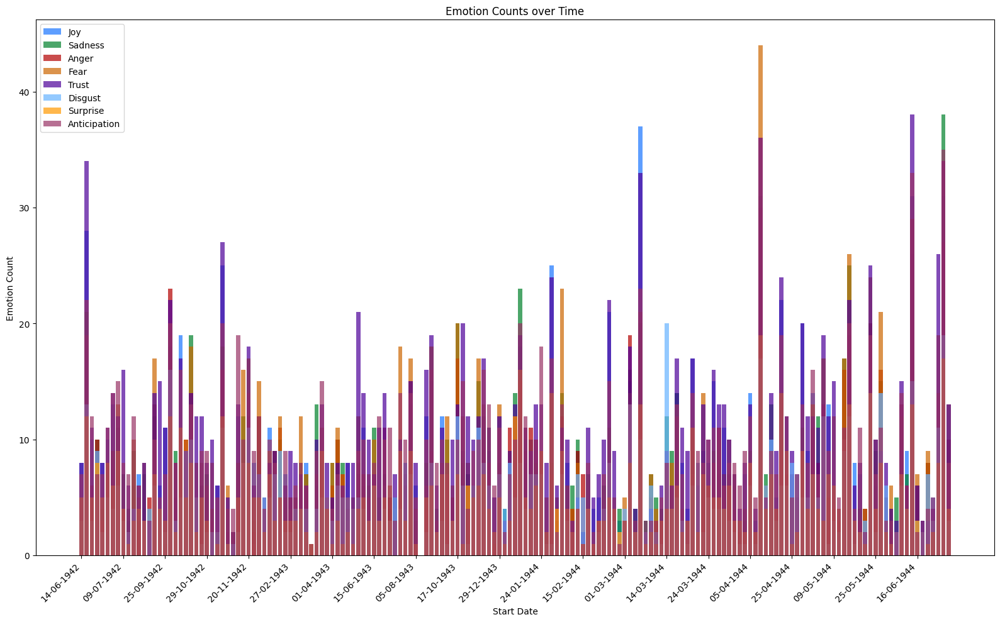

In [137]:
import pandas as pd
import re
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

# Replace 'your_input.csv' with the actual path to your CSV file
csv_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\emotions_between_dates_with_sentiment.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path)

# Convert 'Start Date' to datetime format
df['Start Date'] = pd.to_datetime(df['Start Date'], errors='coerce')

# Filter out rows with NaN dates
df = df.dropna(subset=['Start Date'])

# Plot a bar chart with x-axis ticks for selected dates and dark colors for each emotion
fig, ax = plt.subplots(figsize=(16, 10))  # Increased figure size
emotions = ['Joy', 'Sadness', 'Anger', 'Fear', 'Trust', 'Disgust', 'Surprise', 'Anticipation']

# Define darker colors
colors = ['#1a75ff', '#00802b', '#b30000', '#cc6600', '#4d0099', '#66b2ff', '#ff9900', '#993366']

bar_width = 0.8  # Adjust the width of the bars
bar_space = 1.0  # Adjust the space between the bars

for i, (emotion, color) in enumerate(zip(emotions, colors)):
    positions = range(len(df['Start Date']))
    ax.bar(positions, df[f'{emotion} Count'], label=emotion, color=color, width=bar_width, alpha=0.7)

plt.xlabel('Start Date')
plt.ylabel('Emotion Count')
plt.title('Emotion Counts over Time')
plt.xticks(positions[::8], df['Start Date'][::8].dt.strftime('%d-%m-%Y'), rotation=45, ha='right')  # Set x-axis ticks every 8 positions
plt.legend()
plt.tight_layout()
plt.show()


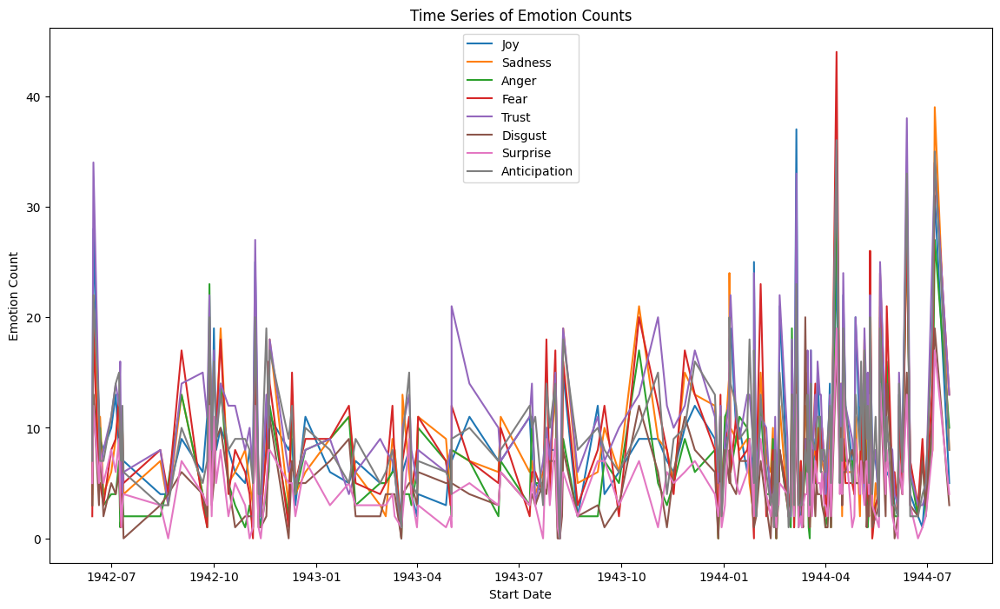

In [129]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame with the provided columns

# Convert 'Start Date' to datetime format
df['Start Date'] = pd.to_datetime(df['Start Date'], errors='coerce')

# Plotting time series line chart
fig, ax = plt.subplots(figsize=(14, 8))

emotions = ['Joy', 'Sadness', 'Anger', 'Fear', 'Trust', 'Disgust', 'Surprise', 'Anticipation']

for emotion in emotions:
    ax.plot(df['Start Date'], df[f'{emotion} Count'], label=emotion)

plt.xlabel('Start Date')
plt.ylabel('Emotion Count')
plt.title('Time Series of Emotion Counts')
plt.legend()
plt.show()


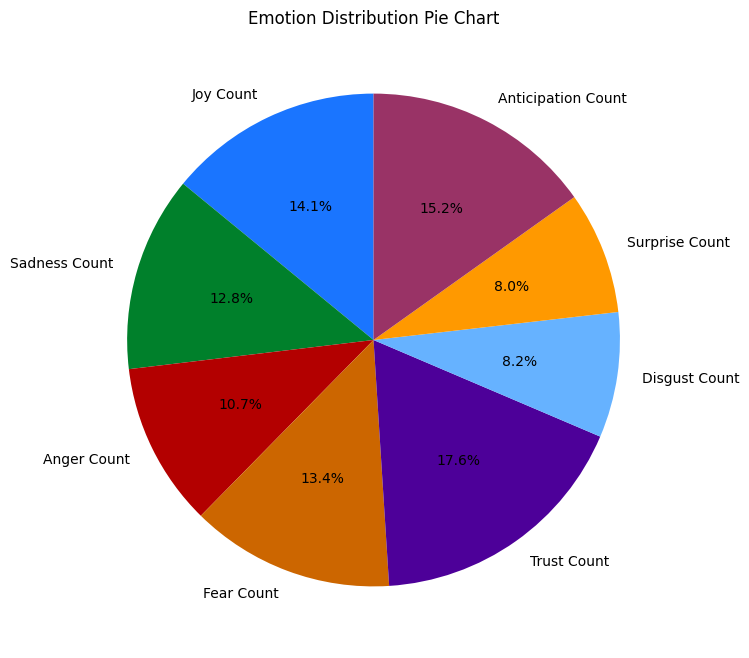

In [138]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame with the provided columns

# Calculate total counts for each emotion
total_counts = df[['Joy Count', 'Sadness Count', 'Anger Count', 'Fear Count', 'Trust Count', 'Disgust Count', 'Surprise Count', 'Anticipation Count']].sum()

# Plotting the pie chart
fig, ax = plt.subplots(figsize=(10, 8))

# Define colors for each emotion
colors = ['#1a75ff', '#00802b', '#b30000', '#cc6600', '#4d0099', '#66b2ff', '#ff9900', '#993366']

ax.pie(total_counts, labels=total_counts.index, autopct='%1.1f%%', colors=colors, startangle=90)

plt.title('Emotion Distribution Pie Chart')
plt.show()



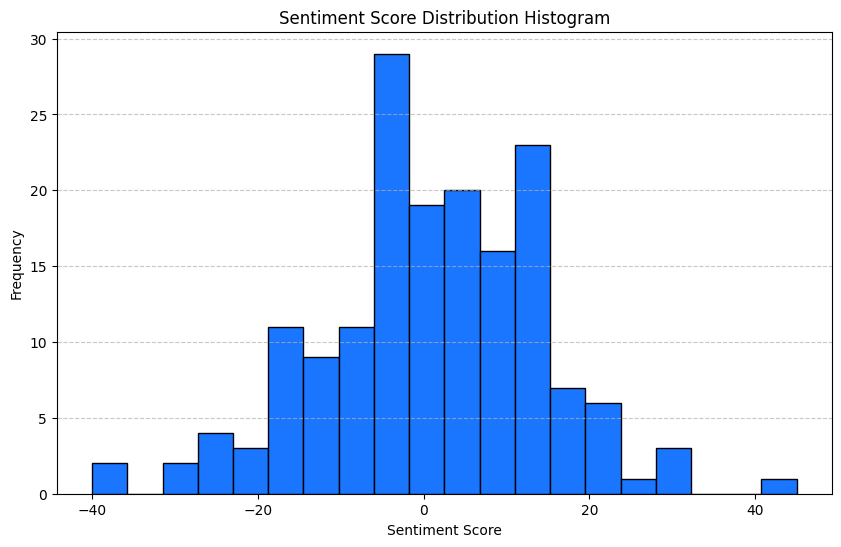

In [139]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame with the provided columns

# Plotting the histogram for Sentiment Scores
fig, ax = plt.subplots(figsize=(10, 6))

# Choose the number of bins for the histogram
num_bins = 20

ax.hist(df['Sentiment Score'], bins=num_bins, color='#1a75ff', edgecolor='black')

plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.title('Sentiment Score Distribution Histogram')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()


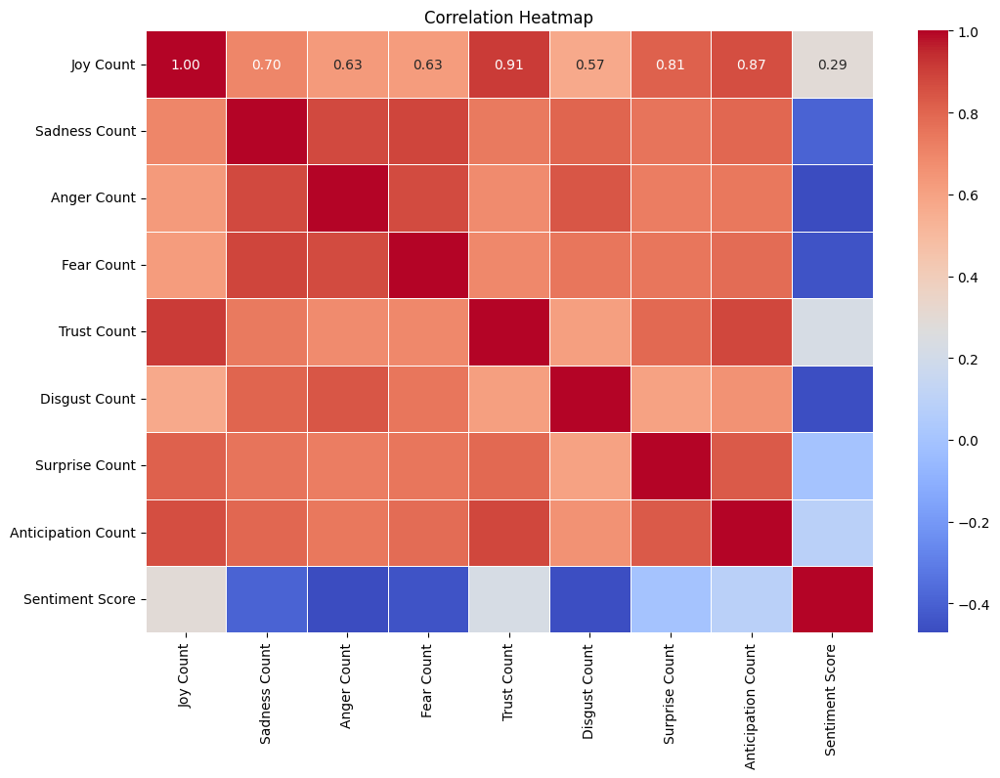

In [132]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Replace 'your_input.csv' with the actual path to your CSV file
csv_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\emotions_between_dates_with_sentiment.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path)

# Select relevant columns for correlation analysis
selected_columns = df[['Joy Count', 'Sadness Count', 'Anger Count', 'Fear Count', 'Trust Count',
                        'Disgust Count', 'Surprise Count', 'Anticipation Count', 'Sentiment Score']]

# Calculate the correlation matrix
correlation_matrix = selected_columns.corr()

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()




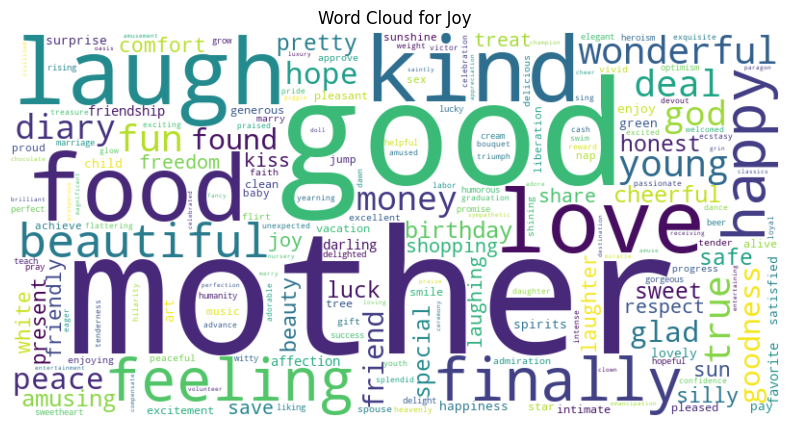

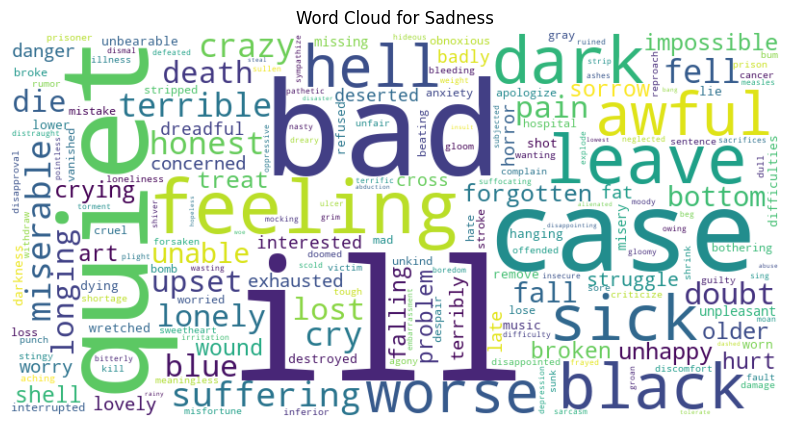

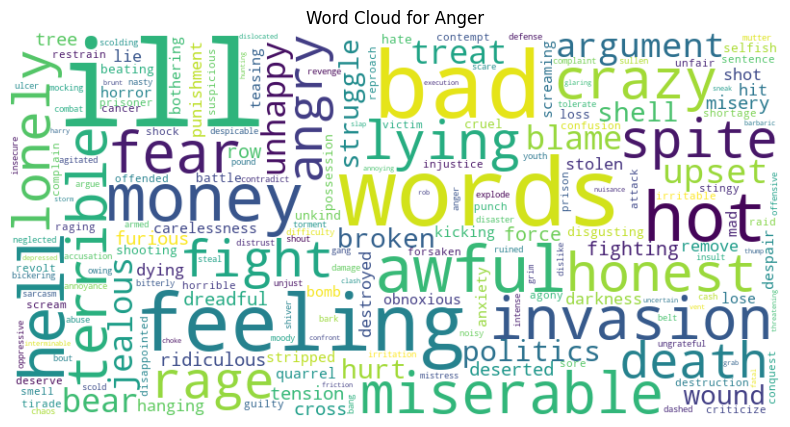

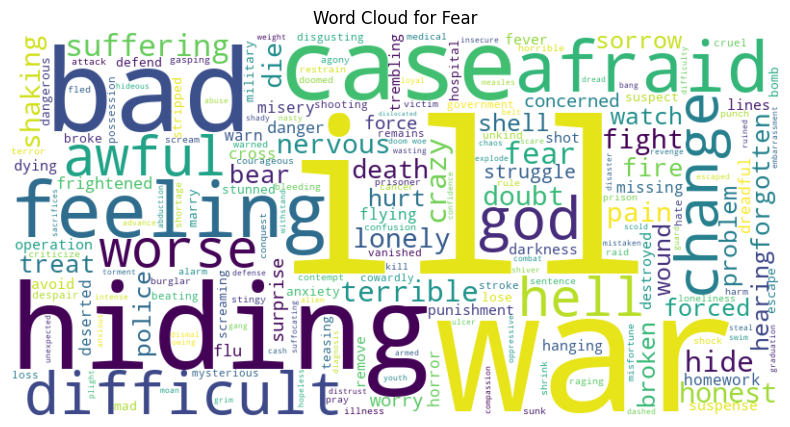

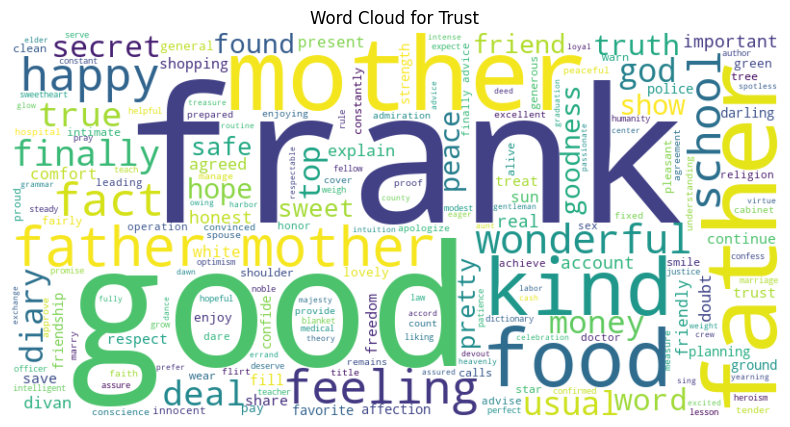

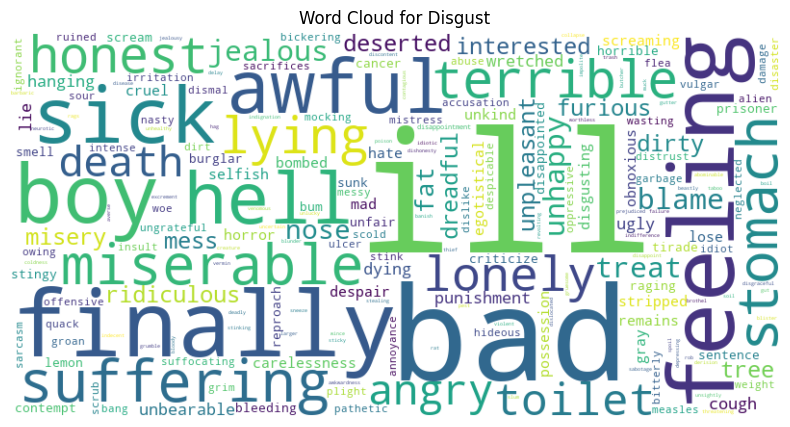

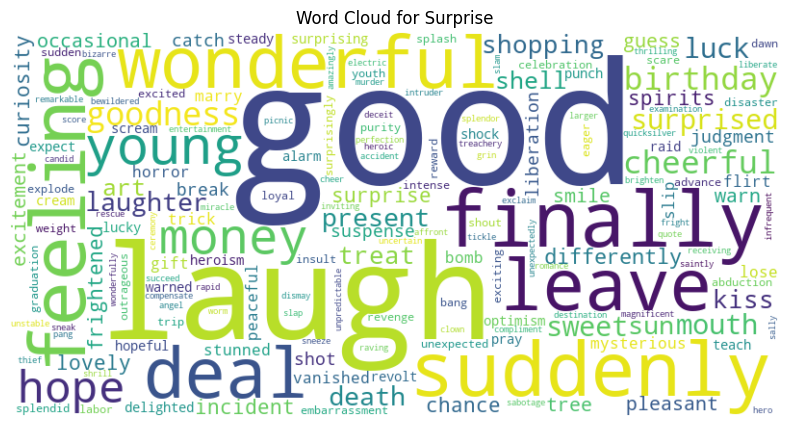

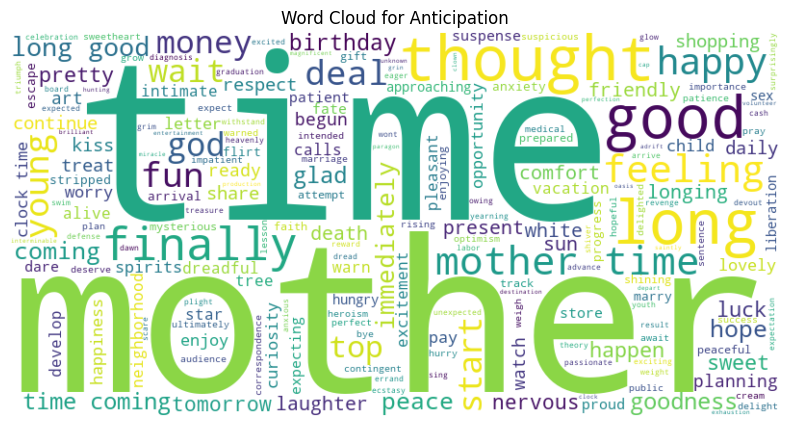

In [140]:
import streamlit as st
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
from wordcloud import WordCloud

# Additional imports for the Word Cloud
from io import StringIO

# Register converters for matplotlib
register_matplotlib_converters()

# Replace 'your_input.csv' with the actual path to your CSV file
csv_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\emotions_between_dates_with_sentiment.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path)

# Convert 'Start Date' to datetime format
df['Start Date'] = pd.to_datetime(df['Start Date'], errors='coerce')

# Filter out rows with NaN dates
df = df.dropna(subset=['Start Date'])

# Extract columns with "Count" in their names
count_columns = [col for col in df.columns if 'Count' in col]

# Set up Streamlit app
st.title('Emotion Analysis Dashboard')

# First Graph - Emotion Counts over Time
st.sidebar.title('Graph 1: Emotion Counts over Time')

# Allow the user to select specific emotion counts with a sidebar widget
selected_emotions = st.sidebar.multiselect('Choose emotions', count_columns)

# Plot selected emotion counts using Matplotlib and display it using st.pyplot()
if selected_emotions:
    fig, ax = plt.subplots(figsize=(16, 10))

    # Define darker colors
    colors = ['#1a75ff', '#00802b', '#b30000', '#cc6600', '#4d0099', '#66b2ff', '#ff9900', '#993366']

    bar_width = 0.8
    bar_space = 1.0

    positions = range(len(df['Start Date']))

    for i, (emotion, color) in enumerate(zip(selected_emotions, colors)):
        ax.bar(positions, df[emotion], label=emotion, color=color, width=bar_width, alpha=0.7)

    plt.xlabel('Start Date')
    plt.ylabel('Emotion Count')
    plt.title('Selected Emotion Counts over Time')
    plt.xticks(positions[::8], df['Start Date'][::8].dt.strftime('%d-%m-%Y'), rotation=45, ha='right')
    plt.legend()
    plt.tight_layout()

    # Display the selected plot using Streamlit
    st.pyplot(fig)
else:
    # If no emotions are selected, display a message
    st.sidebar.info('Please select emotions from the sidebar to visualize.')

# Second Graph - Emotion Distribution Pie Chart
st.sidebar.title('Graph 2: Emotion Distribution Pie Chart')

# Calculate total counts for each emotion
total_counts = df[['Joy Count', 'Sadness Count', 'Anger Count', 'Fear Count', 'Trust Count', 'Disgust Count', 'Surprise Count', 'Anticipation Count']].sum()

# Plotting the pie chart
fig_pie, ax_pie = plt.subplots(figsize=(10, 8))

# Define colors for each emotion
colors_pie = ['#1a75ff', '#00802b', '#b30000', '#cc6600', '#4d0099', '#66b2ff', '#ff9900', '#993366']

ax_pie.pie(total_counts, labels=total_counts.index, autopct='%1.1f%%', colors=colors_pie, startangle=90)

plt.title('Emotion Distribution Pie Chart')

# Display the pie chart using Streamlit
st.pyplot(fig_pie)

# Third Graph - Sentiment Score Distribution Histogram
st.sidebar.title('Graph 3: Sentiment Score Distribution Histogram')

# Plotting the histogram for Sentiment Scores
fig_hist, ax_hist = plt.subplots(figsize=(10, 6))

# Choose the number of bins for the histogram
num_bins = 20

ax_hist.hist(df['Sentiment Score'], bins=num_bins, color='#1a75ff', edgecolor='black')

plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.title('Sentiment Score Distribution Histogram')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the histogram using Streamlit
st.pyplot(fig_hist)

# Fourth Graph - Create a heatmap
st.sidebar.title('Graph 4: Correlation Heatmap')

# Select relevant columns for correlation analysis
selected_columns_corr = df[['Joy Count', 'Sadness Count', 'Anger Count', 'Fear Count', 'Trust Count',
                            'Disgust Count', 'Surprise Count', 'Anticipation Count', 'Sentiment Score']]

# Calculate the correlation matrix
correlation_matrix = selected_columns_corr.corr()

# Display the correlation heatmap using Seaborn and Streamlit
st.set_option('deprecation.showPyplotGlobalUse', False)  # Disable the warning for showing pyplot globally
plt.figure(figsize=(12, 8))
plt.title('Correlation Heatmap')
plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='none')
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.colorbar()
plt.show()

# Optionally, you can add additional information or text below the heatmap
st.info("This heatmap shows the correlation between different emotion counts and sentiment scores.")

# Fifth Graph - Word Cloud for Emotions
st.sidebar.title('Graph 5: Word Clouds for Emotions')

# Generate word clouds for each emotion
for emotion in emotions:
    # Concatenate words for the specified emotion
    words = ' '.join(df[f'{emotion} Words'].dropna())

    # Generate the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(words)

    # Plot the word cloud
    st.image(wordcloud.to_array(), caption=f'Word Cloud for {emotion}')

# Display additional information or text below the word clouds
st.sidebar.info("These word clouds show the most frequent words associated with each emotion.")


In [134]:
!pip install wordcloud


     -------------------------------------- 300.0/300.0 kB 3.1 MB/s eta 0:00:00


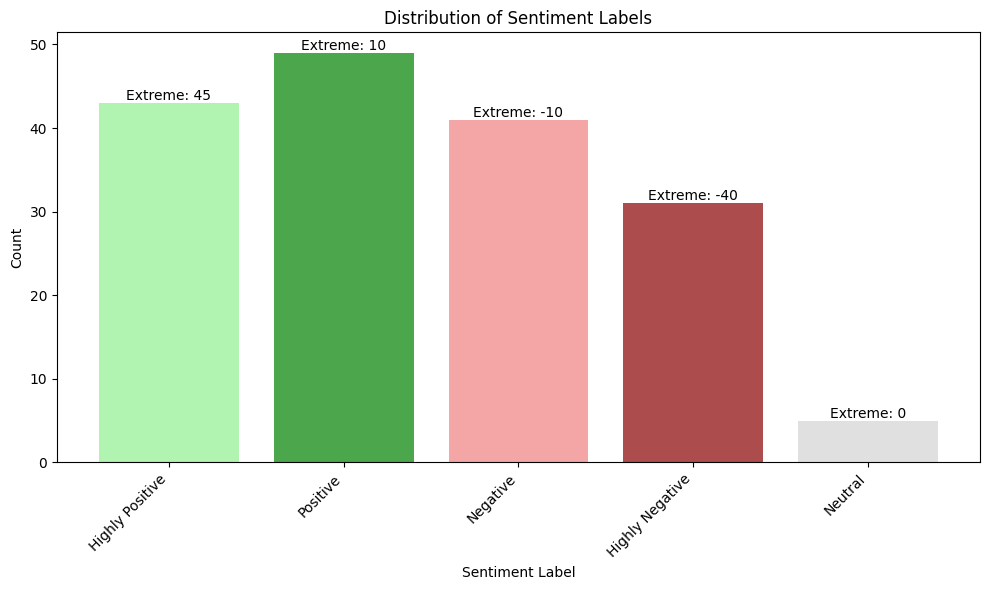

In [151]:
import pandas as pd
import matplotlib.pyplot as plt

# Replace 'your_input.csv' with the actual path to your CSV file
csv_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\emotions_between_dates_with_sentiment.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path)

# Define sentiment categories
sentiment_categories = ['Highly Positive', 'Positive', 'Negative', 'Highly Negative', 'Neutral']

# Prepare data for plotting
plot_data = {'Sentiment Label': [], 'Count': [], 'Extreme Score': []}

for label in sentiment_categories:
    subset = df[df['Sentiment Label'] == label]
    
    if not subset.empty:
        count = subset['Sentiment Label'].count()
        if label in ['Highly Positive', 'Positive']:
            extreme_score = subset['Sentiment Score'].max()
        else:
            extreme_score = subset['Sentiment Score'].min()
        
        plot_data['Sentiment Label'].append(label)
        plot_data['Count'].append(count)
        plot_data['Extreme Score'].append(extreme_score)

# Define colors for each sentiment category
colors = ['lightgreen', 'green', 'lightcoral', 'darkred', 'lightgrey']

# Plot a bar chart for Sentiment Labels with count and extreme score
fig, ax = plt.subplots(figsize=(10, 6))

bars = ax.bar(plot_data['Sentiment Label'], plot_data['Count'], color=colors, alpha=0.7)

# Annotate bars with extreme scores
for bar, score in zip(bars, plot_data['Extreme Score']):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height, f'Extreme: {score}', ha='center', va='bottom')

plt.xlabel('Sentiment Label')
plt.ylabel('Count')
plt.title('Distribution of Sentiment Labels')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [154]:
# Display the column names in your DataFrame
print(df.columns)



Index(['Start Date', 'End Date', 'Joy Count', 'Joy Words', 'Sadness Count',
       'Sadness Words', 'Anger Count', 'Anger Words', 'Fear Count',
       'Fear Words', 'Trust Count', 'Trust Words', 'Disgust Count',
       'Disgust Words', 'Surprise Count', 'Surprise Words',
       'Anticipation Count', 'Anticipation Words', 'Sentiment Score',
       'Sentiment Label'],
      dtype='object')


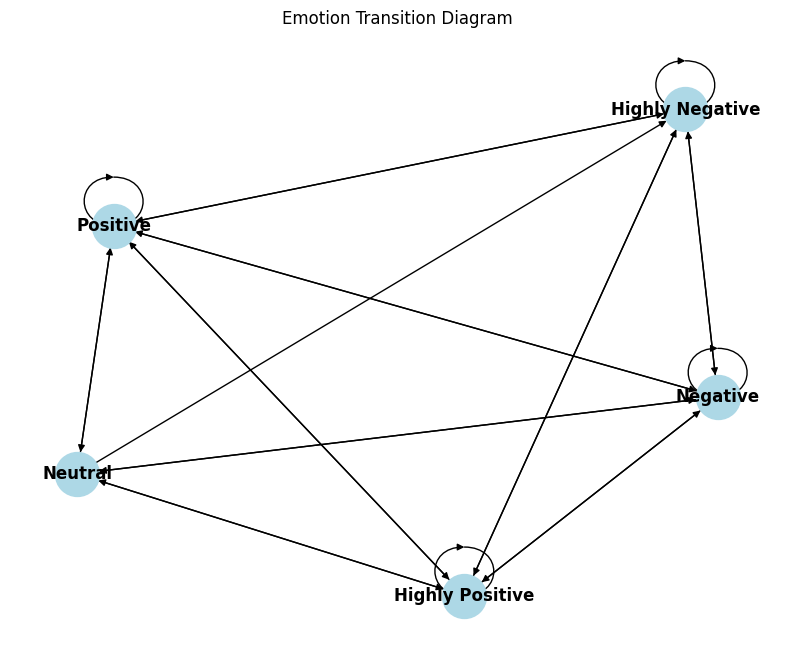

In [169]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Replace 'your_input.csv' with the actual path to your CSV file
csv_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\emotions_between_dates_with_sentiment.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path)

# Create a directed graph
G = nx.DiGraph()

# Iterate through rows and add edges to the graph
for i in range(len(df) - 1):
    current_emotion = df.at[i, 'Sentiment Label']  # Assuming 'Sentiment Label' represents the emotion
    next_emotion = df.at[i + 1, 'Sentiment Label']
    G.add_edge(current_emotion, next_emotion)

# Plot the Emotion Transition Diagram
pos = nx.spring_layout(G)

# Create a new figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Draw the graph
nx.draw(G, pos, with_labels=True, font_weight='bold', node_color='lightblue', font_color='black', node_size=1000, ax=ax)

# Set the title
ax.set_title('Emotion Transition Diagram')

# Show the plot
plt.show()


In [166]:
!pip install --upgrade matplotlib networkx


  Using cached matplotlib-3.8.3-cp310-cp310-win_amd64.whl (7.6 MB)
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.8.2
    Uninstalling matplotlib-3.8.2:


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'c:\\users\\dell\\appdata\\roaming\\python\\python310\\site-packages\\matplotlib\\backends\\_backend_agg.cp310-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



In [175]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Replace 'your_input.csv' with the actual path to your CSV file
csv_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\emotions_between_dates_with_sentiment.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path)

# Convert 'Start Date' to datetime format
df['Start Date'] = pd.to_datetime(df['Start Date'], errors='coerce')

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Function to update the plot for each animation frame
def update(frame):
    ax.clear()

    # Filter data for the current frame
    frame_data = df[df['Start Date'] <= df['Start Date'].min() + pd.to_timedelta(frame, unit='D')]

    # Plot emotion counts over time
    for emotion in ['Joy', 'Sadness', 'Anger', 'Fear', 'Trust', 'Disgust', 'Surprise', 'Anticipation']:
        ax.plot(frame_data['Start Date'], frame_data[f'{emotion} Count'], label=emotion)

    ax.legend()
    ax.set_xlabel('Start Date')
    ax.set_ylabel('Emotion Count')
    ax.set_title('Emotion Counts Over Time')

# Determine the number of frames (days)
num_frames = (df['Start Date'].max() - df['Start Date'].min()).days + 1

# Create the animation
animation = FuncAnimation(fig, update, frames=num_frames, interval=200, repeat=False)

# Display the animated plot
plt.show()


ModuleNotFoundError: No module named 'matplotlib.animation'

In [174]:
!pip install --upgrade matplotlib



  Using cached matplotlib-3.8.3-cp310-cp310-win_amd64.whl (7.6 MB)
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.8.2
    Uninstalling matplotlib-3.8.2:


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'c:\\users\\dell\\appdata\\roaming\\python\\python310\\site-packages\\matplotlib\\backends\\_backend_agg.cp310-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



In [176]:
!pip install plotly


In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Replace 'your_input.csv' with the actual path to your CSV file
csv_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\emotions_between_dates_with_sentiment.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path)

# Convert 'Start Date' to datetime format
df['Start Date'] = pd.to_datetime(df['Start Date'], errors='coerce')

# Define emotions
emotions = ['Joy', 'Sadness', 'Anger', 'Fear', 'Trust', 'Disgust', 'Surprise', 'Anticipation']

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Function to update the plot in each animation frame
def update(frame):
    ax.clear()
    for emotion in emotions:
        ax.plot(df['Start Date'], df[f'{emotion} Count'], label=emotion)
    ax.legend()
    ax.set_title('Animated Time Series of Emotion Counts')
    ax.set_xlabel('Start Date')
    ax.set_ylabel('Count')

# Create an animation
animation = FuncAnimation(fig, update, frames=len(df), repeat=False)

# Show the plot
plt.show()


ImportError: Can't determine version for bottleneck

In [8]:
!pip install --force-reinstall --no-deps bottleneck==1.3.5


  Using cached Bottleneck-1.3.5-cp310-cp310-win_amd64.whl (109 kB)
  Attempting uninstall: bottleneck
    Found existing installation: bottleneck 1.3.5


ERROR: Cannot uninstall bottleneck 1.3.5, RECORD file not found. You might be able to recover from this via: 'pip install --force-reinstall --no-deps bottleneck==1.3.5'.


In [181]:
!pip install --upgrade matplotlib


  Using cached matplotlib-3.8.3-cp310-cp310-win_amd64.whl (7.6 MB)
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.8.2
    Uninstalling matplotlib-3.8.2:


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'c:\\users\\dell\\appdata\\roaming\\python\\python310\\site-packages\\matplotlib\\backends\\_backend_agg.cp310-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



In [9]:
# Create a new virtual environment
python -m venv myenv

# Activate the virtual environment
source myenv/bin/activate  # On Windows, use 'myenv\Scripts\activate'

# Install required packages
pip install pandas matplotlib

# Run your code in this virtual environment


SyntaxError: invalid syntax (3712897827.py, line 2)

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Replace 'your_input.csv' with the actual path to your CSV file
csv_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\emotions_between_dates_with_sentiment.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path)
df['Start Date'] = pd.to_datetime(df['Start Date'])

# Sort DataFrame by date
df = df.sort_values(by='Start Date')

# Define emotions and corresponding colors
emotions = ['Joy', 'Sadness', 'Anger', 'Fear', 'Trust', 'Disgust', 'Surprise', 'Anticipation']
colors = ['#1a75ff', '#00802b', '#b30000', '#cc6600', '#4d0099', '#66b2ff', '#ff9900', '#993366']

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Initialize empty lines for each emotion
lines = [ax.plot([], [], label=emotion, color=color)[0] for emotion, color in zip(emotions, colors)]

# Set up the plot
ax.set_xlabel('Start Date')
ax.set_ylabel('Emotion Count')
ax.set_title('Animated Emotion Counts over Time')
ax.legend(loc='upper left')

# Function to update the plot for each frame
def update(frame):
    for line, emotion in zip(lines, emotions):
        line.set_data(df['Start Date'][:frame], df[f'{emotion} Count'][:frame])
    return lines

# Create an animation
animation = FuncAnimation(fig, update, frames=len(df), interval=100, blit=True)

# Display the animation
plt.show()


ImportError: Can't determine version for bottleneck

In [1]:
!pip install --upgrade --force-reinstall matplotlib


  Using cached matplotlib-3.8.3-cp310-cp310-win_amd64.whl (7.6 MB)
  Using cached numpy-1.26.4-cp310-cp310-win_amd64.whl (15.8 MB)
  Using cached pillow-10.2.0-cp310-cp310-win_amd64.whl (2.6 MB)
  Using cached fonttools-4.49.0-cp310-cp310-win_amd64.whl (2.2 MB)
  Using cached packaging-23.2-py3-none-any.whl (53 kB)
  Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
  Using cached python_dateutil-2.9.0.post0-py2.py3-none-any.whl (229 kB)
  Using cached contourpy-1.2.0-cp310-cp310-win_amd64.whl (186 kB)
  Using cached pyparsing-3.1.2-py3-none-any.whl (103 kB)
  Using cached kiwisolver-1.4.5-cp310-cp310-win_amd64.whl (56 kB)
  Using cached six-1.16.0-py2.py3-none-any.whl (11 kB)
  Attempting uninstall: six
    Found existing installation: six 1.16.0
    Uninstalling six-1.16.0:
      Successfully uninstalled six-1.16.0
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.2
    Uninstalling pyparsing-3.1.2:
      Successfully uninstalled pyparsing-3.1.2
  At

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gensim 4.3.0 requires FuzzyTM>=0.4.0, which is not installed.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.26.4 which is incompatible.
conda-repo-cli 1.0.27 requires clyent==1.2.1, but you have clyent 1.2.2 which is incompatible.
conda-repo-cli 1.0.27 requires nbformat==5.4.0, but you have nbformat 5.7.0 which is incompatible.
conda-repo-cli 1.0.27 requires python-dateutil==2.8.2, but you have python-dateutil 2.9.0.post0 which is incompatible.


In [3]:
!pip install --upgrade --force-reinstall matplotlib


  Using cached matplotlib-3.8.3-cp310-cp310-win_amd64.whl (7.6 MB)
  Using cached pyparsing-3.1.2-py3-none-any.whl (103 kB)
  Using cached kiwisolver-1.4.5-cp310-cp310-win_amd64.whl (56 kB)
  Using cached python_dateutil-2.9.0.post0-py2.py3-none-any.whl (229 kB)
  Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
  Using cached contourpy-1.2.0-cp310-cp310-win_amd64.whl (186 kB)
  Using cached fonttools-4.49.0-cp310-cp310-win_amd64.whl (2.2 MB)
  Using cached pillow-10.2.0-cp310-cp310-win_amd64.whl (2.6 MB)
  Using cached packaging-23.2-py3-none-any.whl (53 kB)
  Using cached numpy-1.26.4-cp310-cp310-win_amd64.whl (15.8 MB)
  Using cached six-1.16.0-py2.py3-none-any.whl (11 kB)
  Attempting uninstall: six
    Found existing installation: six 1.16.0
    Uninstalling six-1.16.0:
      Successfully uninstalled six-1.16.0
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.2
    Uninstalling pyparsing-3.1.2:
      Successfully uninstalled pyparsing-3.1.2
  At

ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'D:\\Anaconda\\Lib\\site-packages\\~umpy.libs\\libopenblas64__v0.3.23-293-gc2f4bdbb-gcc_10_3_0-2bde3a66a51006b2b53eb373ff767a3f.dll'
Consider using the `--user` option or check the permissions.



In [2]:
!pip install pandas


     ---------------------------------------- 11.6/11.6 MB 4.6 MB/s eta 0:00:00
     -------------------------------------- 345.4/345.4 kB 3.6 MB/s eta 0:00:00


In [4]:
pip install --upgrade --force-reinstall bottleneck


     -------------------------------------- 110.1/110.1 kB 3.1 MB/s eta 0:00:00
  Using cached numpy-1.26.4-cp310-cp310-win_amd64.whl (15.8 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
Note: you may need to restart the kernel to use updated packages.


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'D:\\Anaconda\\Lib\\site-packages\\~-mpy.libs\\libopenblas64__v0.3.23-293-gc2f4bdbb-gcc_10_3_0-2bde3a66a51006b2b53eb373ff767a3f.dll'
Consider using the `--user` option or check the permissions.



In [17]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Replace 'your_input.csv' with the actual path to your CSV file
csv_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\emotions_between_dates_with_sentiment.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path)
df['Start Date'] = pd.to_datetime(df['Start Date'])

# Sort DataFrame by date
df = df.sort_values(by='Start Date')

# Define emotions and corresponding colors
emotions = ['Joy', 'Sadness', 'Anger', 'Fear', 'Trust', 'Disgust', 'Surprise', 'Anticipation']
colors = ['#1a75ff', '#00802b', '#b30000', '#cc6600', '#4d0099', '#66b2ff', '#ff9900', '#993366']

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Initialize empty lines for each emotion
lines = [ax.plot([], [], label=emotion, color=color)[0] for emotion, color in zip(emotions, colors)]

# Set up the plot
ax.set_xlabel('Start Date')
ax.set_ylabel('Emotion Count')
ax.set_title('Animated Emotion Counts over Time')
ax.legend(loc='upper left')

# Function to update the plot for each frame
def update(frame):
    for i, emotion in enumerate(emotions):
        lines[i].set_data(df['Start Date'][:frame], df[f'{emotion} Count'][:frame])
    return lines

# Create an animation
animation = FuncAnimation(fig, update, frames=len(df), interval=100, blit=True)

# Display the animation
plt.show()


ImportError: Can't determine version for bottleneck

In [11]:
!pip install bottleneck==1.3.2


     ---------------------------------------- 88.2/88.2 kB 1.7 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'error'


  error: subprocess-exited-with-error
  
  pip subprocess to install build dependencies did not run successfully.
  exit code: 1
  
  [640 lines of output]
  Ignoring numpy: markers 'python_version == "2.7" and platform_system != "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.5" and platform_system != "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.6" and platform_system != "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.7" and platform_system != "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "2.7" and platform_system == "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.5" and platform_system == "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.6" and platform_system == "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.7" and platform_system == 

In [14]:
!pip uninstall bottleneck

Found existing installation: bottleneck 1.3.5


ERROR: Cannot uninstall bottleneck 1.3.5, RECORD file not found. You might be able to recover from this via: 'pip install --force-reinstall --no-deps bottleneck==1.3.5'.


In [15]:
!pip install bottleneck==1.3.2


  Using cached Bottleneck-1.3.2.tar.gz (88 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'error'


  error: subprocess-exited-with-error
  
  pip subprocess to install build dependencies did not run successfully.
  exit code: 1
  
  [641 lines of output]
  Ignoring numpy: markers 'python_version == "2.7" and platform_system != "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.5" and platform_system != "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.6" and platform_system != "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.7" and platform_system != "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "2.7" and platform_system == "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.5" and platform_system == "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.6" and platform_system == "AIX"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.7" and platform_system == 

In [16]:
!pip install --upgrade matplotlib


In [18]:
pip install pandas plotly


In [19]:
import plotly.express as px

# Sort DataFrame by date
df = df.sort_values(by='Start Date')

# Define emotions and corresponding colors
emotions = ['Joy', 'Sadness', 'Anger', 'Fear', 'Trust', 'Disgust', 'Surprise', 'Anticipation']
colors = ['#1a75ff', '#00802b', '#b30000', '#cc6600', '#4d0099', '#66b2ff', '#ff9900', '#993366']

# Create figure
fig = px.line(df, x='Start Date', y=[f'{emotion} Count' for emotion in emotions], color_discrete_sequence=colors,
              labels={'value': 'Emotion Count', 'variable': 'Emotion'},
              title='Animated Emotion Counts over Time')

# Add animation
fig.update_layout(updatemenus=[dict(type='buttons', showactive=False, buttons=[dict(label='Play',
                                            method='animate', args=[None, dict(frame=dict(duration=100, redraw=True), fromcurrent=True)]),
                                          dict(label='Pause', method='animate', args=[[None], dict(frame=dict(duration=0, redraw=True), mode='immediate', transition=dict(duration=0))])])])

frames = [dict(data=[dict(type='scatter', x=df['Start Date'][:i+1], y=df[f'{emotion} Count'][:i+1], mode='lines', name=emotion) for emotion in emotions]) for i in range(len(df))]

fig.frames = frames

# Show the plot
fig.show()


ImportError: Plotly express requires pandas to be installed.

In [20]:
!pip install pandas



In [21]:
import plotly.express as px

# Sort DataFrame by date
df = df.sort_values(by='Start Date')

# Define emotions and corresponding colors
emotions = ['Joy', 'Sadness', 'Anger', 'Fear', 'Trust', 'Disgust', 'Surprise', 'Anticipation']
colors = ['#1a75ff', '#00802b', '#b30000', '#cc6600', '#4d0099', '#66b2ff', '#ff9900', '#993366']

# Create figure
fig = px.line(df, x='Start Date', y=[f'{emotion} Count' for emotion in emotions], color_discrete_sequence=colors,
              labels={'value': 'Emotion Count', 'variable': 'Emotion'},
              title='Animated Emotion Counts over Time')

# Add animation
fig.update_layout(updatemenus=[dict(type='buttons', showactive=False, buttons=[dict(label='Play',
                                            method='animate', args=[None, dict(frame=dict(duration=100, redraw=True), fromcurrent=True)]),
                                          dict(label='Pause', method='animate', args=[[None], dict(frame=dict(duration=0, redraw=True), mode='immediate', transition=dict(duration=0))])])])

frames = [dict(data=[dict(type='scatter', x=df['Start Date'][:i+1], y=df[f'{emotion} Count'][:i+1], mode='lines', name=emotion) for emotion in emotions]) for i in range(len(df))]

fig.frames = frames

# Show the plot
fig.show()


ImportError: Plotly express requires pandas to be installed.

In [2]:
pip install matplotlib


Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install plotly==6.10.0


Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement plotly==6.10.0 (from versions: 0.2, 0.3, 0.4, 0.5, 0.5.1, 0.5.2, 0.5.3, 0.5.4, 0.5.5, 0.5.6, 0.5.7, 0.5.8, 0.5.9, 0.5.10, 0.5.11, 0.5.12, 0.5.13, 1.0.0, 1.0.1, 1.0.2, 1.0.3, 1.0.4, 1.0.5, 1.0.6, 1.0.7, 1.0.8, 1.0.9, 1.0.10, 1.0.11, 1.0.12, 1.0.13, 1.0.14, 1.0.15, 1.0.16, 1.0.17, 1.0.18, 1.0.19, 1.0.20, 1.0.21, 1.0.22, 1.0.23, 1.0.24, 1.0.25, 1.0.26, 1.0.27, 1.0.28, 1.0.29, 1.0.30, 1.0.31, 1.0.32, 1.0.33, 1.0.34, 1.1.0, 1.1.1, 1.1.2, 1.1.3, 1.1.4, 1.2.0, 1.2.1, 1.2.2, 1.2.3, 1.2.4, 1.2.6, 1.2.7, 1.2.8, 1.2.9, 1.3.0, 1.3.1, 1.3.2, 1.4.0, 1.4.1, 1.4.2, 1.4.3, 1.4.4, 1.4.5, 1.4.7, 1.4.9, 1.4.10, 1.4.11, 1.4.12, 1.4.13, 1.4.14, 1.5.0, 1.6.4, 1.6.6, 1.6.7, 1.6.8, 1.6.9, 1.6.10, 1.6.11, 1.6.12, 1.6.13, 1.6.14, 1.6.15, 1.6.16, 1.6.17, 1.6.19, 1.7.0, 1.7.1, 1.7.2, 1.7.3, 1.7.4, 1.7.5, 1.7.6, 1.7.7, 1.7.9, 1.8.0, 1.8.1, 1.8.2, 1.8.3, 1.8.4, 1.8.5, 1.8.6, 1.8.8, 1.8.11, 1.8.12, 1.9.0, 1.9.1, 1.9.2, 1.9.3, 1.9.4, 1.9.5, 1.9.6, 1.9.7, 1

C:\Users\DELL\AppData\Local\Temp\ipykernel_15420\4124400923.py:10: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

D:\Anaconda\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



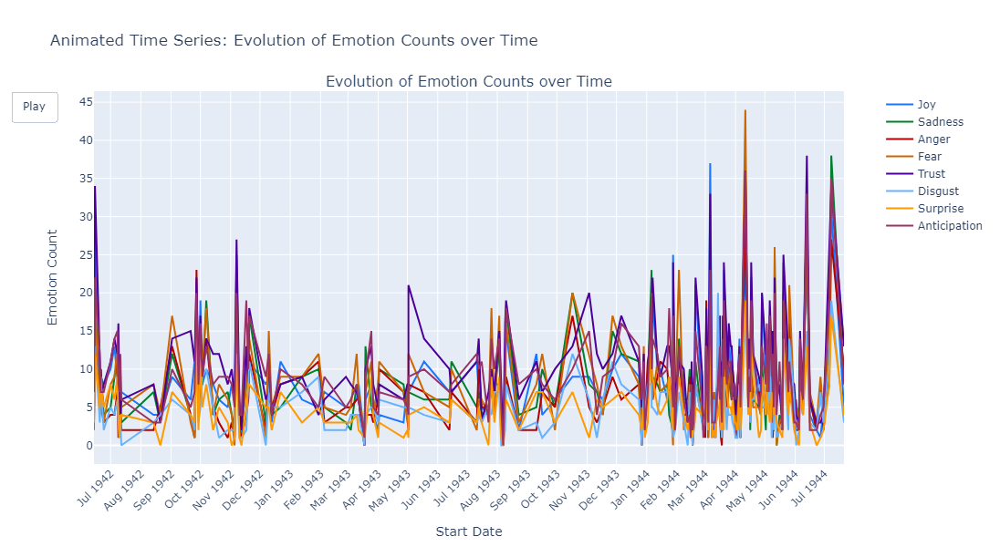

In [5]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Replace 'your_input.csv' with the actual path to your CSV file
csv_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\emotions_between_dates_with_sentiment.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path)
df['Start Date'] = pd.to_datetime(df['Start Date'])

# Sort DataFrame by date
df = df.sort_values(by='Start Date')

# Define emotions and corresponding colors
emotions = ['Joy', 'Sadness', 'Anger', 'Fear', 'Trust', 'Disgust', 'Surprise', 'Anticipation']
colors = ['#1a75ff', '#00802b', '#b30000', '#cc6600', '#4d0099', '#66b2ff', '#ff9900', '#993366']

# Create a subplot with a line chart for the evolution of emotion counts over time
fig = make_subplots(rows=1, cols=1, shared_xaxes=True, subplot_titles=['Evolution of Emotion Counts over Time'])

# Add traces for each emotion
for i, emotion in enumerate(emotions):
    trace = go.Scatter(x=df['Start Date'], y=df[f'{emotion} Count'], name=emotion, line=dict(color=colors[i]))
    fig.add_trace(trace)

# Update layout
fig.update_layout(
    height=600,
    width=1000,
    title_text='Animated Time Series: Evolution of Emotion Counts over Time',
    xaxis_title='Start Date',
    yaxis_title='Emotion Count',
    showlegend=True,
    xaxis=dict(tickangle=-45, dtick='M1'),  # Rotate date labels and set tick frequency to 1 month
    legend=dict(x=1.05, y=1)  # Adjust legend position
)

# Add interactive legend
fig.add_trace(go.Scatter(visible=False, line=dict(color='white'), name='Hide/Show Legend'))  # Dummy trace for interactive legend

# Update frames for animation
frames = [go.Frame(data=[go.Scatter(x=df['Start Date'][:frame], y=df[f'{emotion} Count'][:frame], name=emotion, line=dict(color=colors[i])) for i, emotion in enumerate(emotions)] + 
                       [go.Scatter(visible=False, line=dict(color='white'), name='Hide/Show Legend')]) for frame in range(1, len(df)+1)]
fig.frames = frames

# Update animation settings
animation_settings = dict(frame=dict(duration=100, redraw=True), fromcurrent=True)
fig.update_layout(updatemenus=[dict(type='buttons', showactive=False, buttons=[dict(label='Play',
                                            method='animate', args=[None, animation_settings])])])

# Display the animation
fig.show()


In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter


# Replace 'your_input.csv' with the actual path to your CSV file
csv_file_path = r'C:\Users\DELL\Desktop\Project\Untitled Folder\emotions_between_dates_with_sentiment.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path)
df['Start Date'] = pd.to_datetime(df['Start Date'])

# Sort DataFrame by date
df = df.sort_values(by='Start Date')

# Define emotions and corresponding colors
emotions = ['Joy', 'Sadness', 'Anger', 'Fear', 'Trust', 'Disgust', 'Surprise', 'Anticipation']
colors = ['#1a75ff', '#00802b', '#b30000', '#cc6600', '#4d0099', '#66b2ff', '#ff9900', '#993366']

# Holocaust-related events during World War II
holocaust_events = [
    {'event': 'Wannsee Conference', 'date': '1942-01-20'},
    {'event': 'Operation Reinhard (Aktion Reinhard)', 'date': '1942-03-17'},
    {'event': 'Warsaw Ghetto Uprising', 'date': '1943-04-19'},
    {'event': 'Liquidation of Auschwitz', 'date': '1944-01-27'},
    # Add more events as needed
]

# Create a subplot with a line chart for the evolution of emotion counts over time
fig, ax = plt.subplots(figsize=(10, 6))

# Add traces for each emotion
for i, emotion in enumerate(emotions):
    ax.plot(df['Start Date'], df[f'{emotion} Count'], label=emotion, color=colors[i])

# Add traces for Holocaust-related events
for event in holocaust_events:
    event_date = pd.to_datetime(event['date'])
    ax.axvline(event_date, color='red', linestyle='--', label=f'{event["event"]}')

# Update layout
ax.set_title('Evolution of Emotion Counts over Time with Holocaust-related Events')
ax.set_xlabel('Start Date')
ax.set_ylabel('Emotion Count')
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Rotate date labels
ax.xaxis.set_major_formatter(DateFormatter("%Y-%m-%d"))
plt.xticks(rotation=45)

# Display the chart
plt.tight_layout()
plt.show()


ModuleNotFoundError: No module named 'matplotlib.pyplot'

In [7]:
from sklearn.preprocessing import LabelEncoder

# Assuming 'y_true' is your true sentiment labels and 'y_pred' is your predicted sentiment labels
y_true = ["Highly Positive", "Positive", "Neutral", "Negative", "Highly Negative"]
y_pred = ["Positive", "Positive", "Neutral", "Negative", "Highly Negative"]

# Use LabelEncoder to convert string labels to numerical values
label_encoder = LabelEncoder()
y_true_encoded = label_encoder.fit_transform(y_true)
y_pred_encoded = label_encoder.transform(y_pred)

# Calculate Accuracy
accuracy = accuracy_score(y_true_encoded, y_pred_encoded)
print(f'Accuracy: {accuracy}')

# Calculate Precision
precision = precision_score(y_true_encoded, y_pred_encoded, average='weighted')
print(f'Precision: {precision}')

# Calculate Recall
recall = recall_score(y_true_encoded, y_pred_encoded, average='weighted')
print(f'Recall: {recall}')

# Calculate F1 Score
f1 = f1_score(y_true_encoded, y_pred_encoded, average='weighted')
print(f'F1 Score: {f1}')

# Confusion Matrix
conf_matrix = confusion_matrix(y_true_encoded, y_pred_encoded)
print(f'Confusion Matrix:\n{conf_matrix}')


NameError: name 'accuracy_score' is not defined

In [6]:
!pip install scikit-learn


     ---------------------------------------- 10.6/10.6 MB 8.7 MB/s eta 0:00:00
     ---------------------------------------- 46.2/46.2 MB 7.0 MB/s eta 0:00:00
     -------------------------------------- 302.2/302.2 kB 4.7 MB/s eta 0:00:00
  Attempting uninstall: joblib
    Found existing installation: joblib 1.1.1
    Uninstalling joblib-1.1.1:
      Successfully uninstalled joblib-1.1.1


In [8]:
from sklearn.metrics import accuracy_score


In [9]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score

# Assuming 'y_true' is your true sentiment labels and 'y_pred' is your predicted sentiment labels
y_true = ["Highly Positive", "Positive", "Neutral", "Negative", "Highly Negative"]
y_pred = ["Positive", "Positive", "Neutral", "Negative", "Highly Negative"]

# Encode labels
label_encoder = LabelEncoder()
y_true_encoded = label_encoder.fit_transform(y_true)
y_pred_encoded = label_encoder.transform(y_pred)

# Calculate Accuracy
accuracy = accuracy_score(y_true_encoded, y_pred_encoded)
print(f'Accuracy: {accuracy}')


Accuracy: 0.8


In [10]:
from sklearn.metrics import confusion_matrix, classification_report

# Assuming 'y_true' is your true sentiment labels and 'y_pred' is your predicted sentiment labels
y_true = ["Highly Positive", "Positive", "Neutral", "Negative", "Highly Negative"]
y_pred = ["Highly Positive", "Positive", "Neutral", "Negative", "Highly Negative"]

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Display the confusion matrix
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and display classification report
class_report = classification_report(y_true, y_pred)
print("\nClassification Report:")
print(class_report)


Confusion Matrix:
[[1 0 0 0 0]
 [0 1 0 0 0]
 [0 0 1 0 0]
 [0 0 0 1 0]
 [0 0 0 0 1]]

Classification Report:
                 precision    recall  f1-score   support

Highly Negative       1.00      1.00      1.00         1
Highly Positive       1.00      1.00      1.00         1
       Negative       1.00      1.00      1.00         1
        Neutral       1.00      1.00      1.00         1
       Positive       1.00      1.00      1.00         1

       accuracy                           1.00         5
      macro avg       1.00      1.00      1.00         5
   weighted avg       1.00      1.00      1.00         5



In [11]:
!pip install nltk


In [28]:
!pip install transformers



In [30]:
!pip install torch


     -------------------------------------- 198.6/198.6 MB 3.9 MB/s eta 0:00:00
  Using cached typing_extensions-4.10.0-py3-none-any.whl (33 kB)
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.4.0
    Uninstalling typing_extensions-4.4.0:
      Successfully uninstalled typing_extensions-4.4.0


In [32]:
pip install --upgrade tqdm ipywidgets


     ---------------------------------------- 78.3/78.3 kB 4.3 MB/s eta 0:00:00
     -------------------------------------- 139.4/139.4 kB 1.7 MB/s eta 0:00:00
     -------------------------------------- 215.0/215.0 kB 2.6 MB/s eta 0:00:00
     ---------------------------------------- 2.3/2.3 MB 3.8 MB/s eta 0:00:00
  Attempting uninstall: tqdm
    Found existing installation: tqdm 4.64.1
    Uninstalling tqdm-4.64.1:
      Successfully uninstalled tqdm-4.64.1
  Attempting uninstall: jupyterlab-widgets
    Found existing installation: jupyterlab-widgets 1.0.0
    Uninstalling jupyterlab-widgets-1.0.0:
      Successfully uninstalled jupyterlab-widgets-1.0.0
  Attempting uninstall: comm
    Found existing installation: comm 0.1.2
    Uninstalling comm-0.1.2:
      Successfully uninstalled comm-0.1.2
Note: you may need to restart the kernel to use updated packages.
